# `mne_denoise.viz` — Visual QA Showcase

**Dataset:** Runabout (OpenNeuro ds003690), sub-01, task-oddball  
**Branch/Commit:** `feature/viz`  
**Purpose:** Exercise all visualization functions in `mne_denoise.viz` on real EEG data so each plot can be reviewed for publication readiness.

### Run Contract

| Item | Value |
|------|-------|
| Python | 3.12 |
| MNE-Python | >= 1.8 |
| mne_denoise | 0.0.1 (editable install from this repo) |
| Data | `data/runabout/sub-01/` (BIDS BrainVision, ~60 MB) |
| Estimated runtime | ~5 min (mainly TFR in Sec 6.5) |
| Hardware | Any machine with >= 8 GB RAM |

### Sections

| # | Section | Claim / What is tested | # Figs |
|---|---------|------------------------|--------|
| 1 | Environment | Reproducibility contract | 0 |
| 2 | Data loading & preprocessing | Standard EEG pipeline | 0 |
| 3 | ZapLine: line-noise removal | 50 Hz artifact cleaned with minimal distortion | 0 |
| 4 | DSS: ERP denoising | Evoked response enhanced via AverageBias | 0 |
| 5 | Theme helpers | `use_theme`, `themed_figure`, `get_color` work correctly | 2 |
| 6 | Comparison plots | Before/after visual QC for DSS denoising | 8 |
| 7 | Component plots | DSS component inspection | 8 |
| 8 | DSS diagnostic plots | Eigenvalues, patterns, summary | 3 |
| 9 | ZapLine plots | ZapLine-specific diagnostics | 5 |
| 10 | Benchmark plots | Multi-method comparison from derivatives | 9 |

**Not tested** (by design):  
`set_theme` (mutates global rcParams in a notebook run).

---
## 1 — Environment & Reproducibility

In [1]:
"""Cell 1.1 · Environment contract — pin versions, set seeds, configure display."""
from __future__ import annotations

import os
import platform
import sys
import warnings

import matplotlib
import matplotlib.pyplot as plt
import mne
import numpy as np
import pandas as pd
from scipy.signal import welch

from mne_denoise import viz
from mne_denoise.dss import DSS, AverageBias
from mne_denoise.zapline import ZapLine

# ── Reproducibility ──
RANDOM_SEED = 42
rng = np.random.default_rng(RANDOM_SEED)

warnings.filterwarnings("ignore", category=RuntimeWarning)
mne.set_log_level("WARNING")

%matplotlib inline
plt.rcParams["figure.dpi"] = 120
plt.rcParams["figure.max_open_warning"] = 50

# ── Output directory for saved figures ──
OUT_DIR = os.path.join("data", "runabout", "derivatives", "mne-denoise", "figures")
os.makedirs(OUT_DIR, exist_ok=True)

print(f"Python   : {sys.version.split()[0]}")
print(f"OS       : {platform.system()} {platform.release()}")
print(f"MNE      : {mne.__version__}")
print(f"NumPy    : {np.__version__}")
print(f"Matplotlib: {matplotlib.__version__}")
print(f"Pandas   : {pd.__version__}")
print(f"viz funcs: {len(viz.__all__)}")
print(f"Seed     : {RANDOM_SEED}")
print(f"Figures → : {OUT_DIR}")

Python   : 3.12.9
OS       : Windows 11
MNE      : 1.11.0
NumPy    : 2.4.2
Matplotlib: 3.10.8
Pandas   : 3.0.1
viz funcs: 70
Seed     : 42
Figures → : data\runabout\derivatives\mne-denoise\figures


---
## 2 — Data Loading & Preprocessing

**Claim:** Standard minimal preprocessing (resample, re-reference, high-pass) produces clean continuous data.  
**Checks:** Channel count, duration, montage applied.  
**Outputs:** `raw` (mne.io.Raw), `info` (mne.Info), `sfreq` (float).

In [2]:
"""Cell 2.1 · Load BrainVision, resample, re-reference, filter."""
# ── Constants ──
LINE_FREQ = 50.0  # European mains (Hz)
RESAMPLE_FREQ = 250  # Hz
HP_FREQ = 0.5  # Hz, high-pass
DSS_N_COMPONENTS = 5
DSS_N_KEEP = 3
SUB = "sub-01"

# ── Load ──
vhdr = os.path.join("data", "runabout", SUB, "eeg", f"{SUB}_task-oddball_eeg.vhdr")
raw = mne.io.read_raw_brainvision(vhdr, preload=True, verbose=False)
raw.resample(RESAMPLE_FREQ, verbose=False)
raw.pick_types(eeg=True, verbose=False)

# ── Re-reference to mastoids (or average if unavailable) ──
if "FCz" not in raw.ch_names:
    raw.add_reference_channels("FCz")
raw.set_montage("standard_1020", on_missing="warn")

mastoids = [ch for ch in ["TP9", "TP10"] if ch in raw.ch_names]
if len(mastoids) == 2:
    raw.set_eeg_reference(mastoids, verbose=False)
    raw.drop_channels(mastoids)
else:
    raw.set_eeg_reference("average", verbose=False)

raw.filter(l_freq=HP_FREQ, h_freq=None, verbose=False)

sfreq = raw.info["sfreq"]
info = raw.info

print(f"{raw.info['nchan']} channels · {raw.n_times / sfreq:.1f} s · {sfreq} Hz")
print(f"Reference: {mastoids if len(mastoids) == 2 else 'average'}")
print(f"Channels: {raw.ch_names[:5]} ... ({len(raw.ch_names)} total)")

31 channels · 3134.1 s · 250.0 Hz
Reference: ['TP9', 'TP10']
Channels: ['Fp1', 'Fz', 'F3', 'F7', 'FT9'] ... (31 total)


---
## 3 — ZapLine: Line-Noise Removal

**Claim:** ZapLine removes 50 Hz (+ harmonics) with automatic component selection.  
**Checks:** `n_removed_` is reasonable (typically 1–5); eigenvalue spectrum shows clear gap.  
**Outputs:** `data_before_zap`, `data_after_zap` (ndarrays), `zap` (fitted ZapLine).

In [3]:
"""Cell 3.1 · Fit ZapLine (50 Hz, auto n_remove, 3 harmonics)."""
raw_before_zap = raw.copy()
data_before_zap = raw_before_zap.get_data()

zap = ZapLine(sfreq=sfreq, line_freq=LINE_FREQ, n_remove="auto", n_harmonics=3)
data_after_zap = zap.fit_transform(data_before_zap)

# Update raw in-place for downstream epoching
raw._data = data_after_zap.copy()

print(f"Components removed : {zap.n_removed_}")
print(f"Top-6 eigenvalues  : {zap.eigenvalues_[:6].round(4)}")

Components removed : 4
Top-6 eigenvalues  : [0.1211 0.0323 0.0275 0.0117 0.0066 0.0058]


---
## 4 — DSS: ERP Denoising (AverageBias)

**Claim:** DSS with AverageBias enhances the evoked response by maximising trial-to-trial reproducibility.  
**Checks:** Odd/even split = no leakage (fit on odd, evaluate on even). Eigenvalue drop-off indicates signal dimensionality.  
**Outputs:** `dss` (fitted), `epochs_train/test`, `epochs_denoised`, `evoked_orig/denoised`, `sources_train`.

**Leakage note:** DSS is fitted on `epochs_train` (odd indices) only. `epochs_test` is held out. All denoised data shown below is from the training set unless noted otherwise.

In [4]:
"""Cell 4.1 · Extract events and create epochs."""
events, event_id = mne.events_from_annotations(raw, verbose=False)

# Select the most frequent event type
event_counts = {k: int(np.sum(events[:, 2] == v)) for k, v in event_id.items()}
target_label = max(event_counts, key=event_counts.get)
target_id = event_id[target_label]
print(f"Event: '{target_label}' (id={target_id}, n={event_counts[target_label]})")

epochs = mne.Epochs(
    raw,
    events,
    event_id={target_label: target_id},
    tmin=-0.2,
    tmax=0.8,
    baseline=(-0.2, 0),
    preload=True,
    verbose=False,
)
epochs.drop_bad(reject={"eeg": 125e-6}, verbose=False)

n_ep = len(epochs)
idx_train = np.arange(0, n_ep, 2)  # odd trials (0-indexed even)
idx_test = np.arange(1, n_ep, 2)  # even trials
epochs_train = epochs[idx_train]
epochs_test = epochs[idx_test]
print(f"{n_ep} epochs total → train={len(epochs_train)}, test={len(epochs_test)}")

Event: 'Stimulus/S  1' (id=1, n=4503)
231 epochs total → train=116, test=115


In [5]:
"""Cell 4.2 · Fit DSS on training epochs, reconstruct denoised data."""
bias = AverageBias(axis="epochs")
dss = DSS(bias=bias, n_components=DSS_N_COMPONENTS, component_action="extract")
dss.fit(epochs_train)

# Transform → zero out components beyond N_KEEP → inverse transform
sources_train = dss.transform(epochs_train)
sources_kept = sources_train.copy()
sources_kept[:, DSS_N_KEEP:, :] = 0
recon = dss.inverse_transform(sources_kept)
if recon.ndim == 2:
    recon = recon[np.newaxis, ...]  # edge case: single epoch

epochs_denoised = mne.EpochsArray(
    recon,
    epochs_train.info,
    tmin=epochs_train.tmin,
    verbose=False,
)

evoked_orig = epochs_train.average()
evoked_denoised = epochs_denoised.average()

print(f"DSS eigenvalues : {dss.eigenvalues_[:DSS_N_COMPONENTS].round(5)}")
print(f"Kept components : {DSS_N_KEEP} / {DSS_N_COMPONENTS}")
print(f"Recon shape     : {recon.shape}")

DSS eigenvalues : [0.07595 0.04941 0.02128 0.01812 0.01625]
Kept components : 3 / 5
Recon shape     : (116, 31, 251)


---
## 5 — Theme Helpers

**What is tested:** `use_theme` (context manager), `themed_figure` (axes factory), `get_color` (palette lookup).  
**Expected:** Consistent spines-off, Wong palette, journal-ready font sizes.

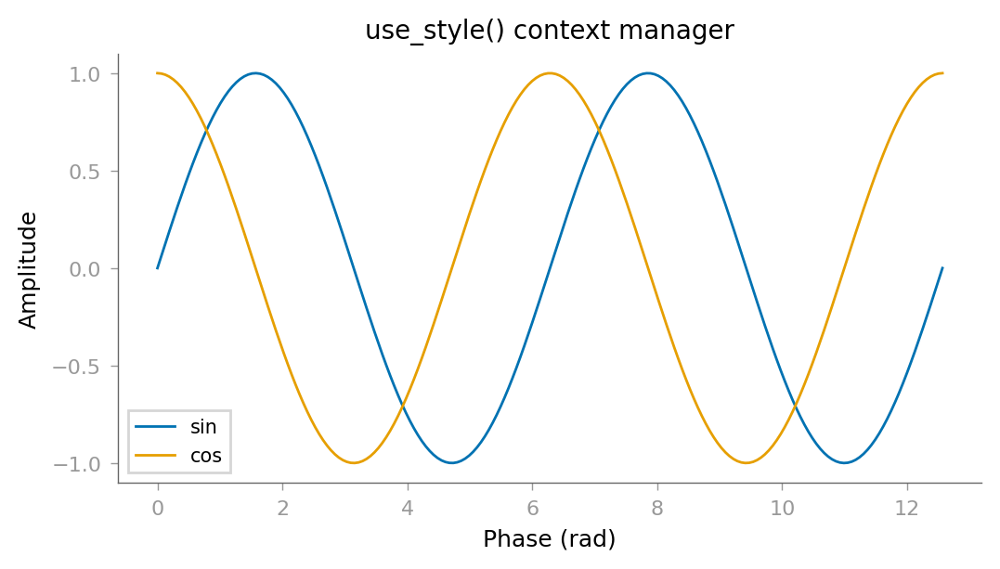

In [6]:
"""Fig 5.1 · use_theme() context manager."""
with viz.use_theme():
    fig, ax = plt.subplots(figsize=(6, 3))
    t = np.linspace(0, 4 * np.pi, 200)
    ax.plot(t, np.sin(t), color=viz.get_color("blue"), label="sin")
    ax.plot(t, np.cos(t), color=viz.get_color("orange"), label="cos")
    ax.set(
        xlabel="Phase (rad)", ylabel="Amplitude", title="use_theme() context manager"
    )
    ax.legend()
fig.savefig(
    os.path.join(OUT_DIR, "fig_05_1_use_theme.png"), dpi=300, bbox_inches="tight"
)
plt.show()

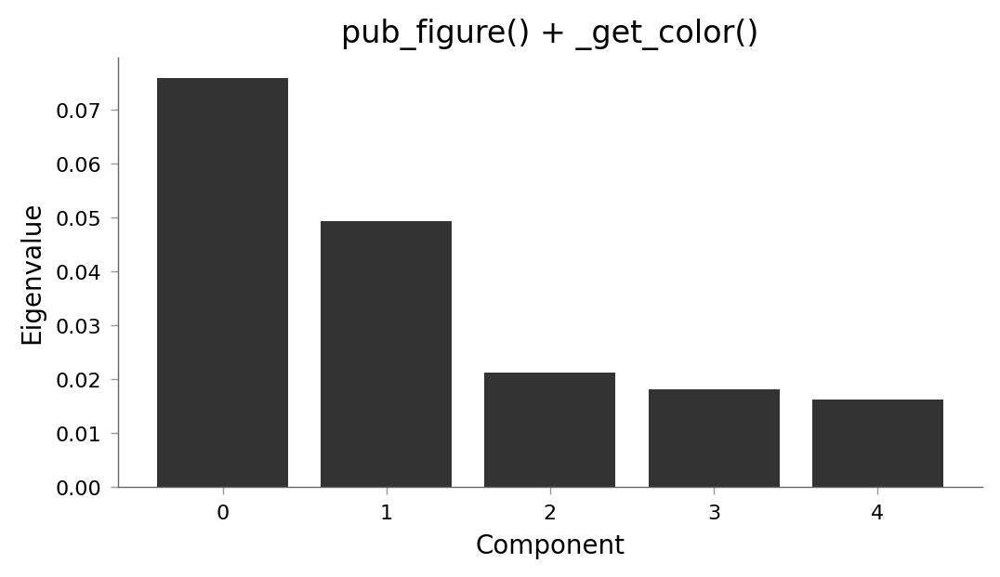

In [7]:
"""Fig 5.2 · themed_figure() + get_color()."""
fig, ax = viz.themed_figure(figsize=(6, 3))
colors = [viz.get_color(f"C{i}") for i in range(DSS_N_COMPONENTS)]
ax.bar(range(DSS_N_COMPONENTS), dss.eigenvalues_[:DSS_N_COMPONENTS], color=colors)
ax.set(xlabel="Component", ylabel="Eigenvalue", title="themed_figure() + get_color()")
fig.savefig(
    os.path.join(OUT_DIR, "fig_05_2_themed_figure.png"), dpi=300, bbox_inches="tight"
)
plt.show()

---
## 6 — Comparison Plots (8 functions)

**What is tested:** Before/after visual QC for the DSS denoising applied in Section 4.  
**Data shown:** `epochs_train` (original) vs `epochs_denoised` (DSS-reconstructed).  
**Known issues from code audit:**
- `plot_psd_comparison` uses hardcoded black/red (not colorblind-safe).
- `plot_evoked_gfp_comparison` uses hardcoded red/blue defaults and `np.random.default_rng(42)` for bootstrap CI.
- `plot_spectrogram_comparison` is slow (~30s) due to TFR computation.

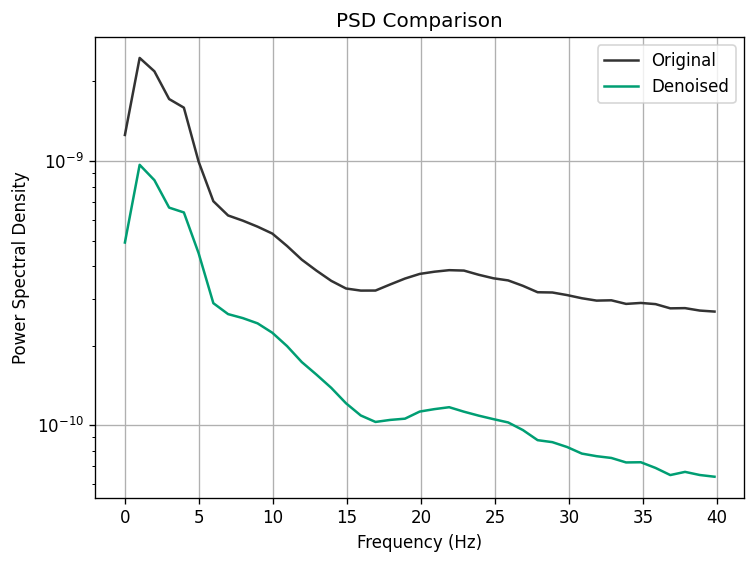

In [8]:
"""Fig 6.1 · plot_psd_comparison — PSD before vs after DSS."""
fig = viz.plot_psd_comparison(epochs_train, epochs_denoised, fmax=40, show=False)
fig.savefig(
    os.path.join(OUT_DIR, "fig_06_1_psd_comparison.png"), dpi=300, bbox_inches="tight"
)
plt.show()

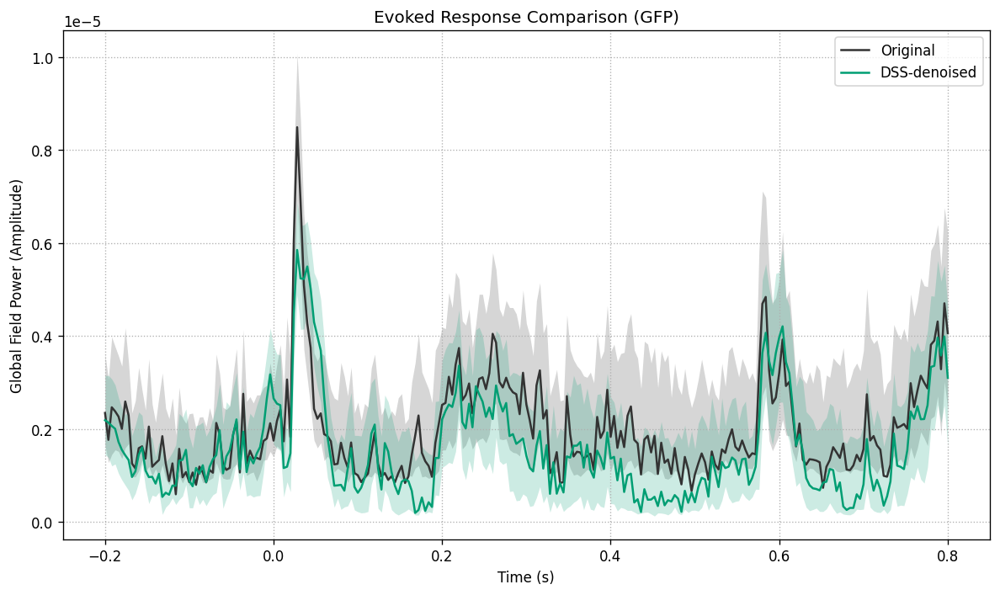

In [9]:
"""Fig 6.2 · plot_evoked_gfp_comparison — GFP with bootstrap CI."""
fig = viz.plot_evoked_gfp_comparison(
    epochs_train,
    epochs_denoised,
    times=epochs_train.times,
    labels=("Original", "DSS-denoised"),
    show=False,
)
fig.savefig(
    os.path.join(OUT_DIR, "fig_06_2_evoked_comparison.png"),
    dpi=300,
    bbox_inches="tight",
)
plt.show()

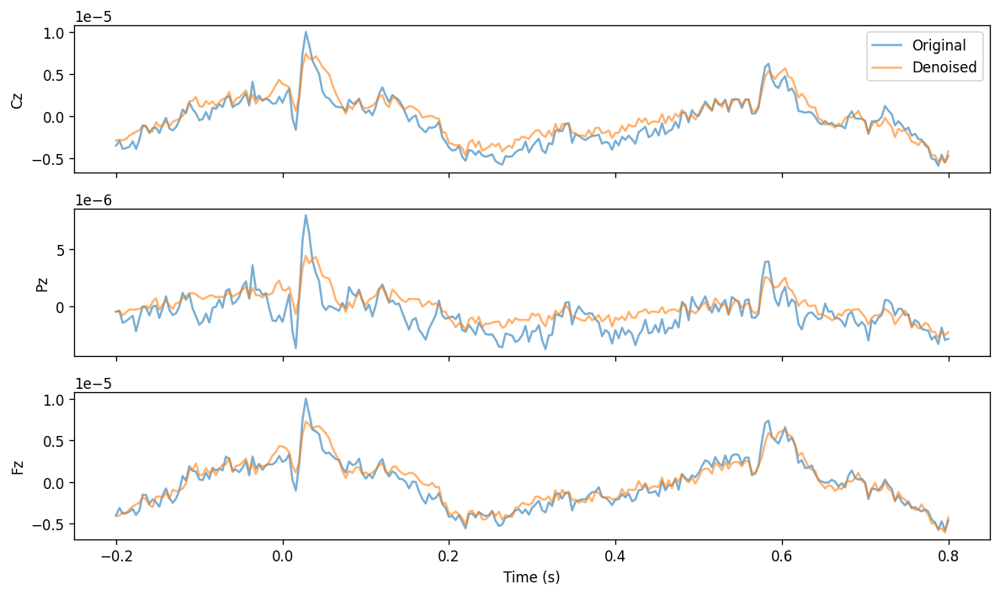

In [10]:
"""Fig 6.3 · plot_channel_time_course_comparison — per-channel evoked."""
fig = viz.plot_channel_time_course_comparison(
    evoked_orig,
    evoked_denoised,
    picks=["Cz", "Pz", "Fz"],
    times=evoked_orig.times,
    show=False,
)
fig.savefig(
    os.path.join(OUT_DIR, "fig_06_3_time_course.png"), dpi=300, bbox_inches="tight"
)
plt.show()

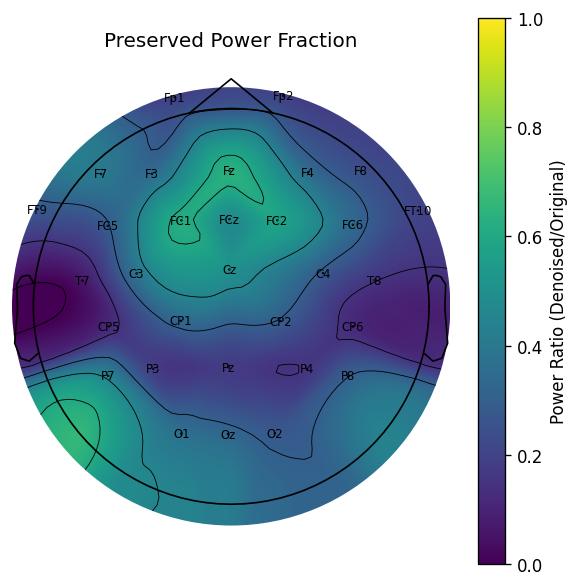

In [11]:
"""Fig 6.4 · plot_power_ratio_map — topographic variance ratio."""
fig = viz.plot_power_ratio_map(
    epochs_train,
    epochs_denoised,
    info=info,
    show=False,
)
fig.savefig(
    os.path.join(OUT_DIR, "fig_06_4_power_map.png"), dpi=300, bbox_inches="tight"
)
plt.show()

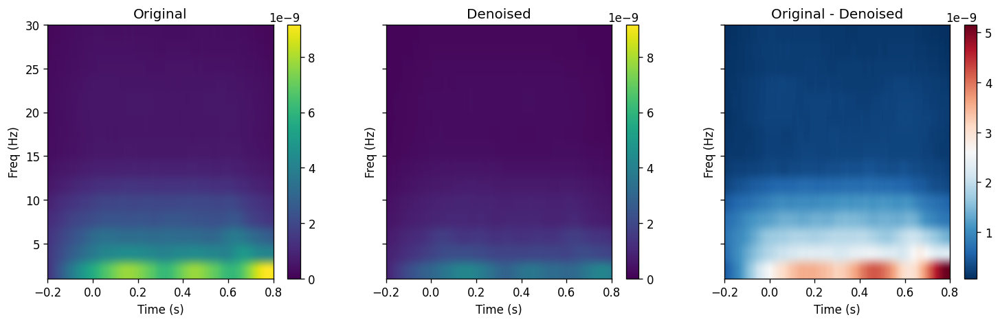

In [12]:
"""Fig 6.5 · plot_spectrogram_comparison — TFR (slow, ~30s)."""
fig = viz.plot_spectrogram_comparison(
    epochs_train,
    epochs_denoised,
    fmin=1,
    fmax=30,
    n_freqs=15,
    picks=[epochs_train.ch_names.index("Cz")] if "Cz" in epochs_train.ch_names else [0],
    times=epochs_train.times,
    show=False,
)
fig.savefig(
    os.path.join(OUT_DIR, "fig_06_5_spectrogram.png"), dpi=300, bbox_inches="tight"
)
plt.show()

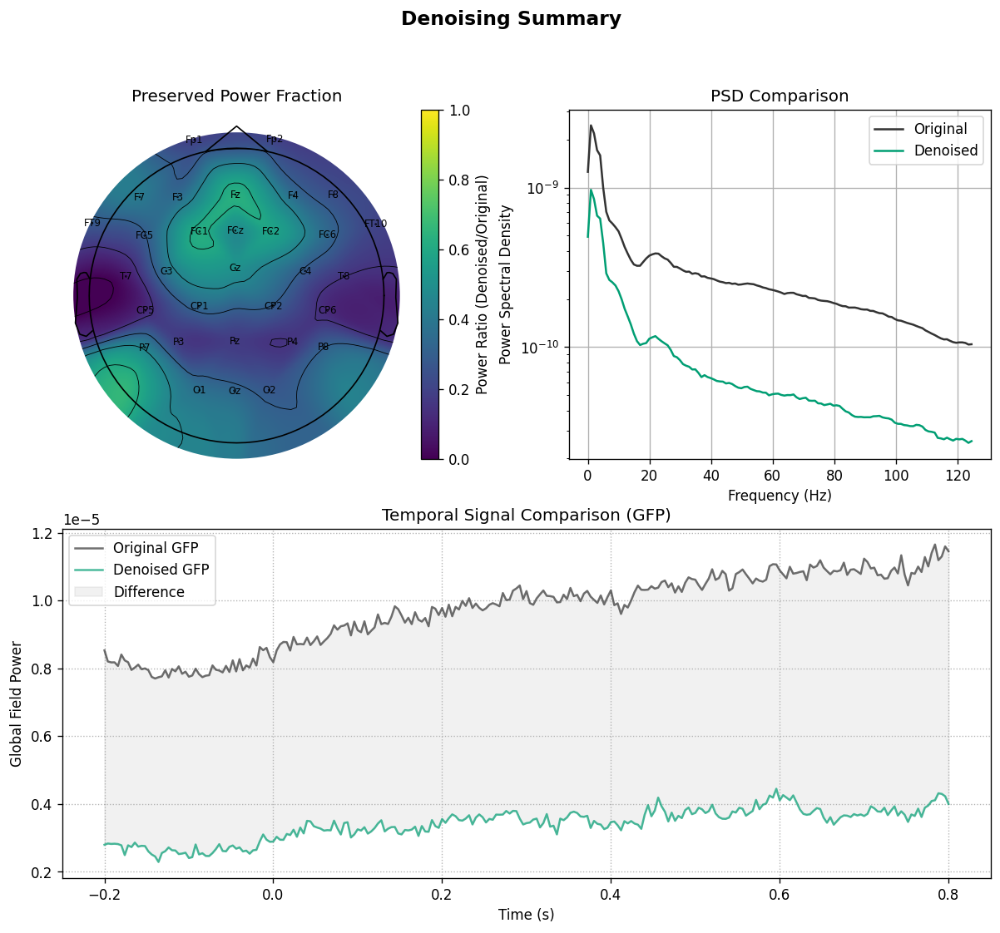

In [13]:
"""Fig 6.6 · plot_denoising_summary — multi-panel dashboard."""
fig = viz.plot_denoising_summary(
    epochs_train,
    epochs_denoised,
    info=info,
    times=epochs_train.times,
    show=False,
)
fig.savefig(
    os.path.join(OUT_DIR, "fig_06_6_denoising_summary.png"),
    dpi=300,
    bbox_inches="tight",
)
plt.show()

D:\mne-denoise\condescending-liskov\mne_denoise\viz\_theme.py:277: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


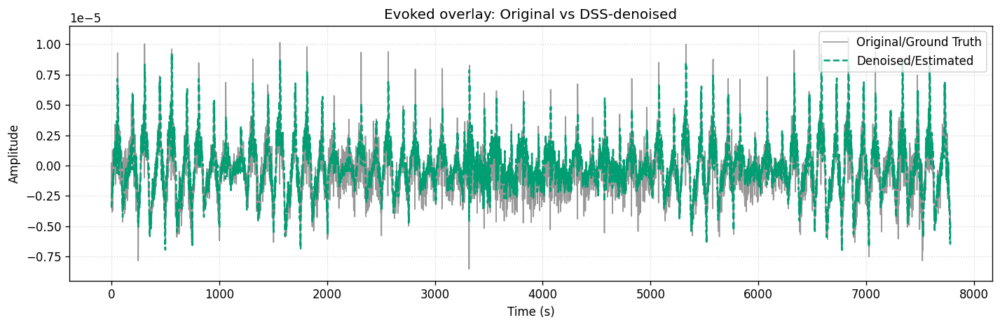

In [14]:
"""Fig 6.7 · plot_signal_overlay — waveform overlay."""
fig = viz.plot_signal_overlay(
    evoked_orig,
    evoked_denoised,
    times=evoked_orig.times,
    pick=0,
    title="Evoked overlay: Original vs DSS-denoised",
    show=False,
)
fig.savefig(os.path.join(OUT_DIR, "fig_06_7_overlay.png"), dpi=300, bbox_inches="tight")
plt.show()

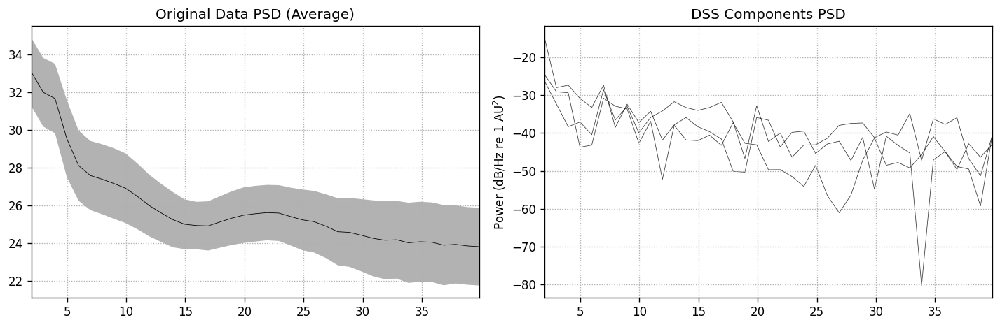

In [15]:
"""Fig 6.8 · plot_component_psd_comparison — DSS component spectra."""
avg_sources = sources_train.mean(axis=0)  # (n_components, n_times)
fig = viz.plot_component_psd_comparison(
    epochs_train,
    avg_sources,
    component_indices=[0, 1, 2],
    sfreq=sfreq,
    show=False,
)
fig.savefig(
    os.path.join(OUT_DIR, "fig_06_8_spectral_psd.png"), dpi=300, bbox_inches="tight"
)
plt.show()

---
## 7 — Component Plots (8 functions)

**What is tested:** DSS component inspection — scores, topographies, time courses, images.  
**Known issues:**
- `plot_component_patterns` uses MNE internal API (`info._unlock()`).
- `plot_component_time_series` uses hardcoded `steelblue`/`gray` colors, x-axis in samples not seconds.
- `plot_narrowband_score_scan` and `plot_time_frequency_mask` use synthetic data (no DSS narrowband scan was run).

D:\mne-denoise\condescending-liskov\mne_denoise\viz\_theme.py:277: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


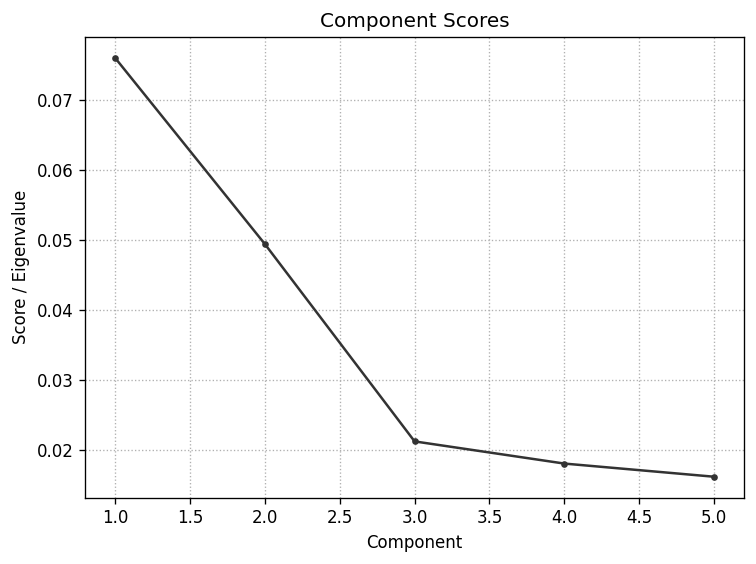

In [16]:
"""Fig 7.1 · plot_component_score_curve — DSS eigenvalue scree."""
fig = viz.plot_component_score_curve(dss, show=False)
fig.savefig(
    os.path.join(OUT_DIR, "fig_07_1_score_curve.png"), dpi=300, bbox_inches="tight"
)
plt.show()

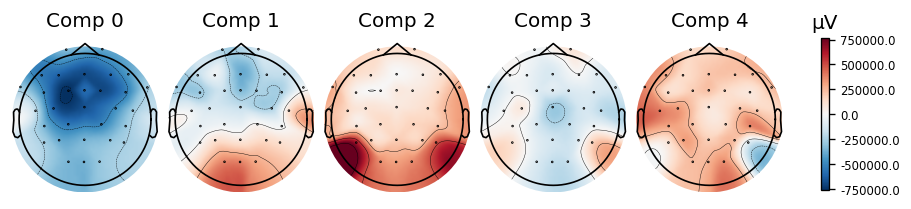

In [17]:
"""Fig 7.2 · plot_component_patterns — DSS component topomaps."""
fig = viz.plot_component_patterns(
    dss, info=info, n_components=DSS_N_COMPONENTS, show=False
)
# NOTE: This function returns an MNE figure; fname not supported by the function.
if fig is not None:
    fig.savefig(
        os.path.join(OUT_DIR, "fig_07_2_spatial_patterns.png"),
        dpi=300,
        bbox_inches="tight",
    )
plt.show()

D:\mne-denoise\condescending-liskov\mne_denoise\viz\_theme.py:277: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


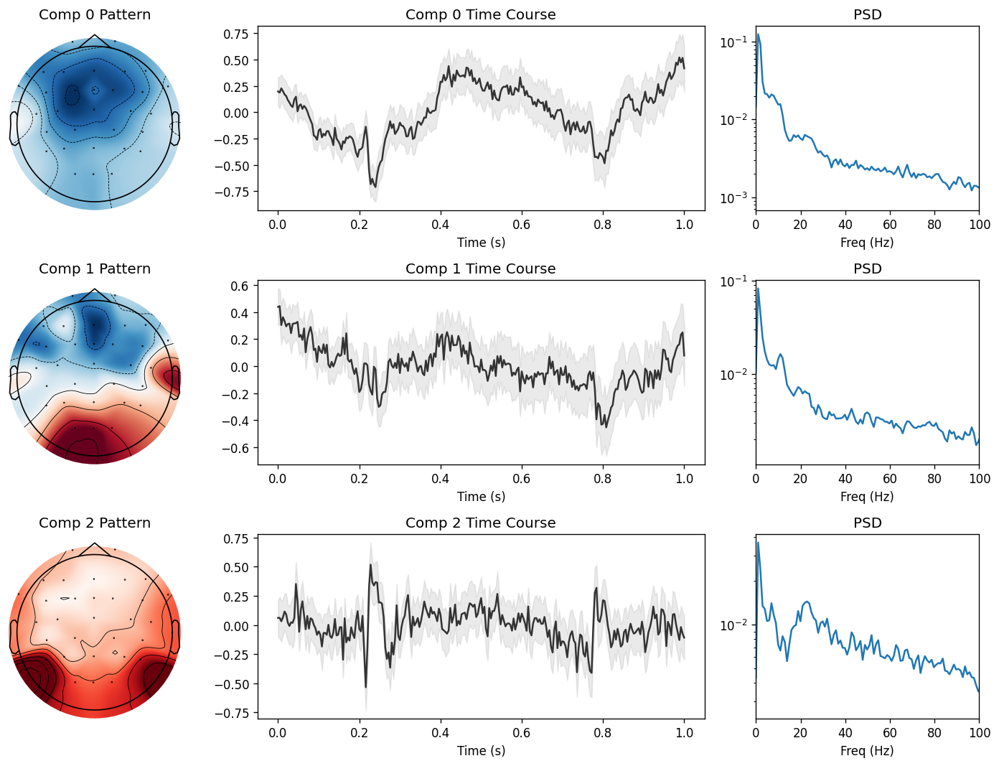

In [18]:
"""Fig 7.3 · plot_component_summary — topo + time + PSD per component."""
fig = viz.plot_component_summary(
    dss,
    data=epochs_train,
    info=info,
    n_components=3,
    show=False,
)
fig.savefig(
    os.path.join(OUT_DIR, "fig_07_3_component_summary.png"),
    dpi=300,
    bbox_inches="tight",
)
plt.show()

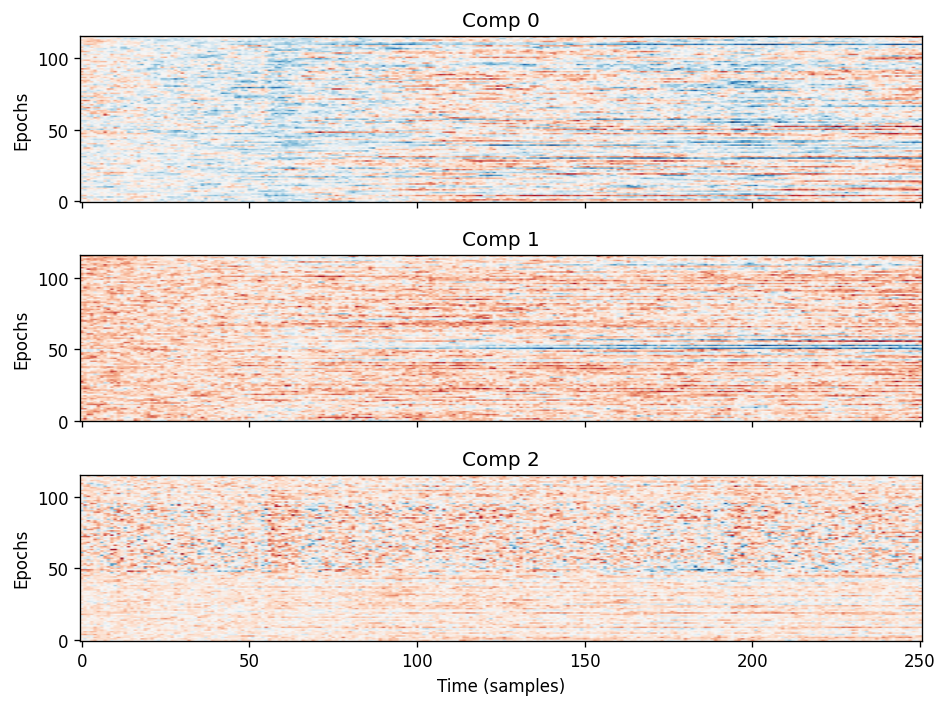

In [19]:
"""Fig 7.4 · plot_component_epochs_image — epoch×time raster per component."""
fig = viz.plot_component_epochs_image(
    dss, data=epochs_train, n_components=3, show=False
)
fig.savefig(
    os.path.join(OUT_DIR, "fig_07_4_component_image.png"), dpi=300, bbox_inches="tight"
)
plt.show()

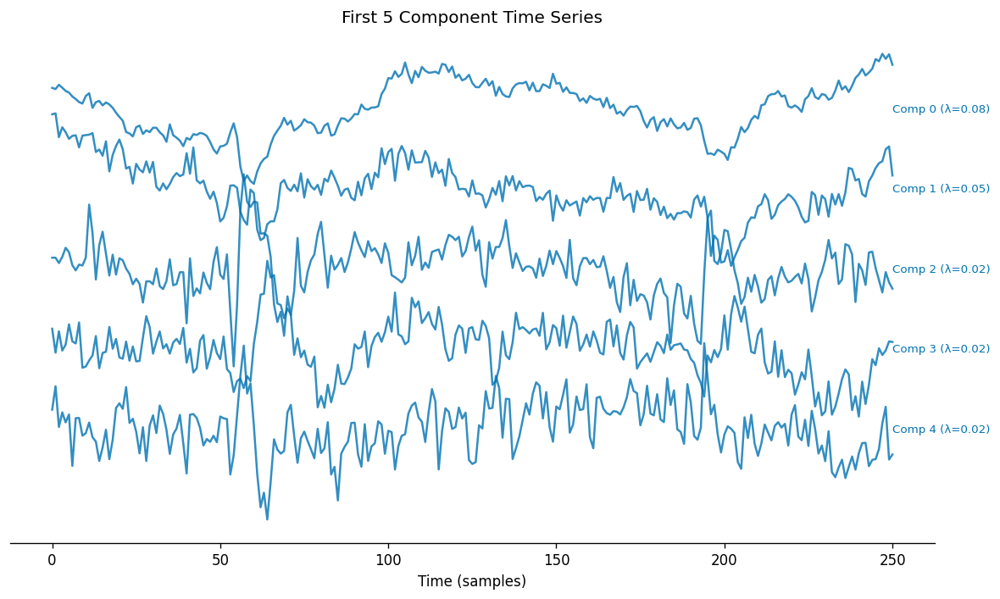

In [20]:
"""Fig 7.5 · plot_component_time_series — stacked traces."""
fig = viz.plot_component_time_series(
    dss,
    data=epochs_train,
    n_components=DSS_N_COMPONENTS,
    show=False,
)
fig.savefig(
    os.path.join(OUT_DIR, "fig_07_5_component_ts.png"), dpi=300, bbox_inches="tight"
)
plt.show()

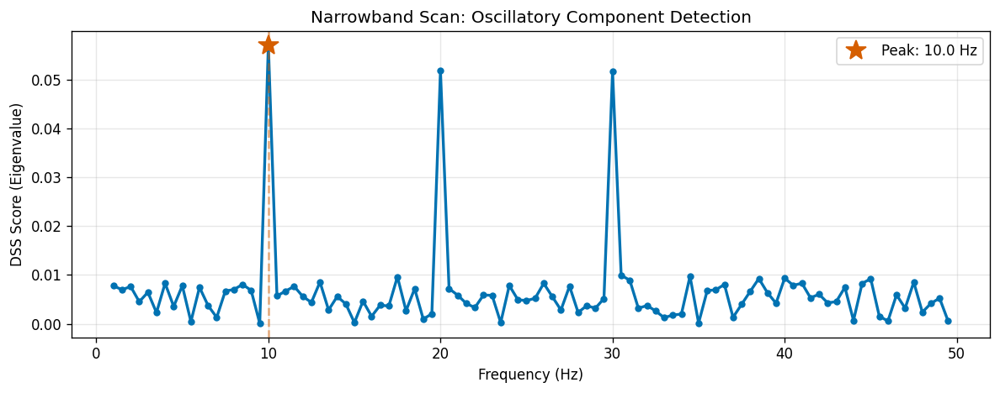

In [21]:
"""Fig 7.6 · plot_narrowband_score_scan — synthetic frequency sweep.

NOTE: Uses synthetic data (no narrowband DSS scan was run on this subject).
This cell tests the plotting function only.
"""
scan_freqs = np.arange(1, 50, 0.5)
scan_eigs = rng.random((len(scan_freqs), 3)) * 0.01  # deterministic via rng
for peak in [10, 20, 30]:
    idx = np.argmin(np.abs(scan_freqs - peak))
    scan_eigs[idx, 0] += 0.05

fig = viz.plot_narrowband_score_scan(scan_freqs, scan_eigs, peak_freq=10, show=False)
fig.savefig(
    os.path.join(OUT_DIR, "fig_07_6_narrowband_scan.png"), dpi=300, bbox_inches="tight"
)
plt.show()

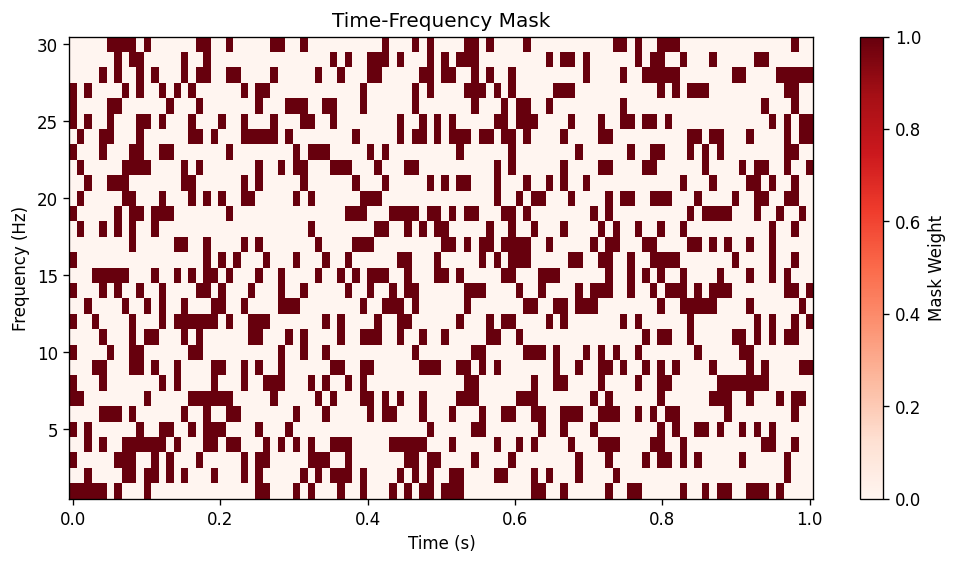

In [22]:
"""Fig 7.7 · plot_time_frequency_mask — synthetic time-frequency mask.

NOTE: Uses synthetic data. Tests the plotting function only.
"""
n_t, n_f = 100, 30
times_mask = np.linspace(0, 1, n_t)
freqs_mask = np.linspace(1, 30, n_f)
mask = rng.random((n_f, n_t)) > 0.7  # deterministic

fig = viz.plot_time_frequency_mask(mask, times_mask, freqs_mask, show=False)
fig.savefig(os.path.join(OUT_DIR, "fig_07_7_tf_mask.png"), dpi=300, bbox_inches="tight")
plt.show()

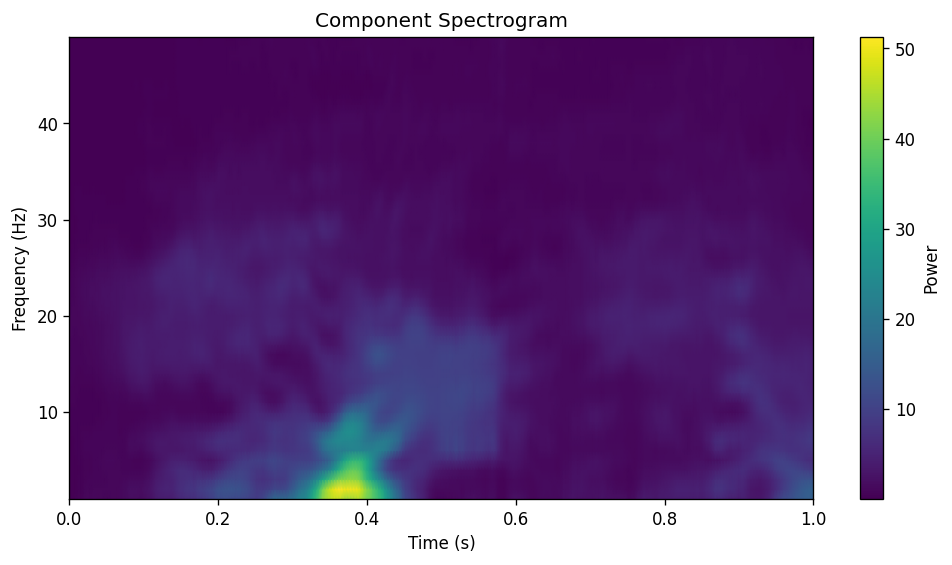

In [23]:
"""Fig 7.8 · plot_component_spectrogram — TFR of first DSS component."""
comp0 = sources_train[0, 0, :]  # first epoch, first component
fig = viz.plot_component_spectrogram(comp0, sfreq=sfreq, show=False)
fig.savefig(
    os.path.join(OUT_DIR, "fig_07_8_component_tfr.png"), dpi=300, bbox_inches="tight"
)
plt.show()

---
## 8 — DSS Diagnostic Plots (3 functions)

**What is tested:** Eigenvalue spectrum, spatial patterns, full summary dashboard.  
**Known issues:**
- None of the 3 DSS plot functions support `fname` — must save externally.
- `plot_component_cleaning_summary` calls `plt.show()` directly (not via `_finalize_fig`); no figure close on `show=False` → potential memory leak.

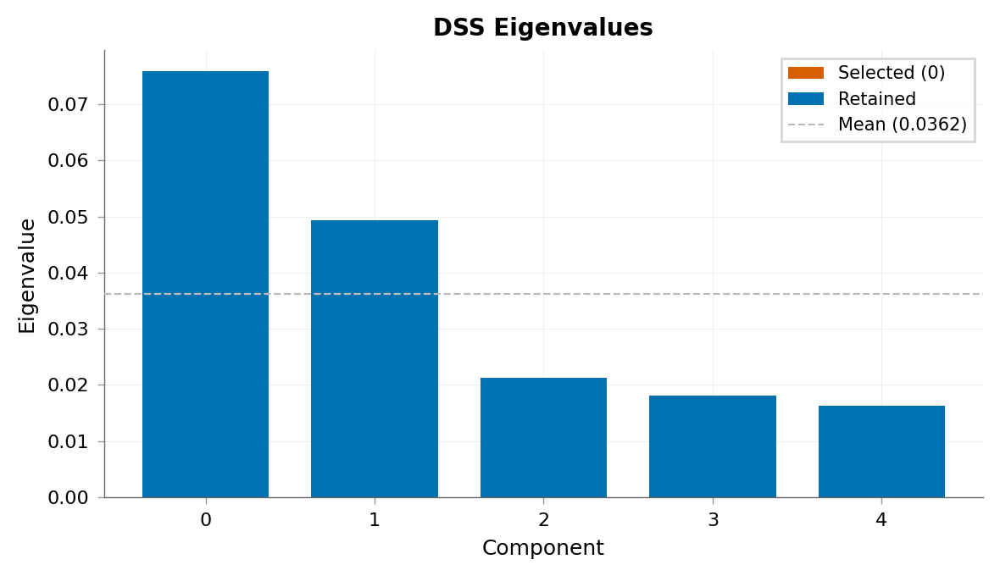

In [24]:
"""Fig 8.1 · plot_component_score_curve — bar chart with selection threshold."""
fig = viz.plot_component_score_curve(dss, show=False)
if fig is not None:
    fig.savefig(
        os.path.join(OUT_DIR, "fig_08_1_dss_eigenvalues.png"),
        dpi=300,
        bbox_inches="tight",
    )
plt.show()

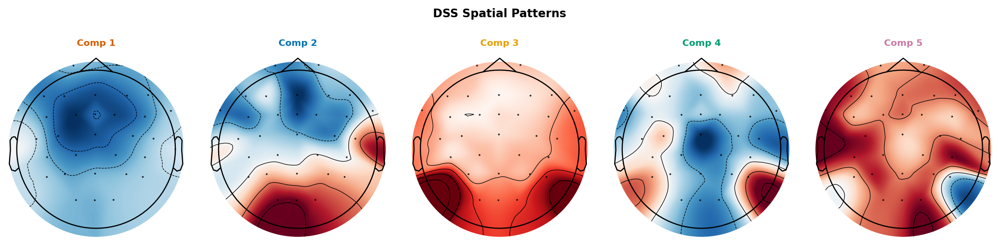

In [25]:
"""Fig 8.2 · plot_component_patterns — topomaps or stem fallback."""
fig = viz.plot_component_patterns(
    dss, info=info, n_components=DSS_N_COMPONENTS, show=False
)
if fig is not None:
    fig.savefig(
        os.path.join(OUT_DIR, "fig_08_2_dss_patterns.png"), dpi=300, bbox_inches="tight"
    )
plt.show()

D:\mne-denoise\condescending-liskov\mne_denoise\viz\_theme.py:277: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


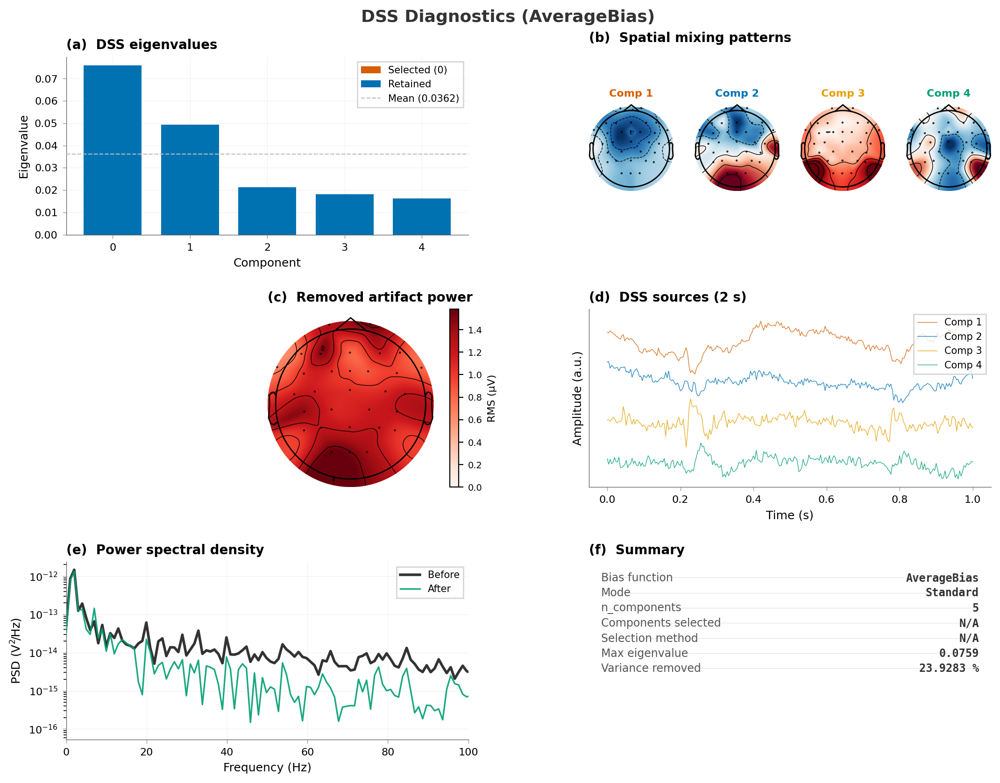

In [27]:
"""Fig 8.3 · plot_component_cleaning_summary — 3x2 dashboard."""
data_before_2d = evoked_orig.get_data()  # (n_ch, n_times)
data_after_2d = evoked_denoised.get_data()  # (n_ch, n_times)

fig = viz.plot_component_cleaning_summary(
    scores=getattr(dss, "scores_", getattr(dss, "eigenvalues_", None)),
    selected_count=1,
    patterns=getattr(dss, "patterns_", None),
    removed=data_before_2d - data_after_2d,
    sources=avg_sources,
    sfreq=sfreq,
    info=info,
    show=False,
)
fig.savefig(
    os.path.join(OUT_DIR, "fig_08_3_dss_summary.png"), dpi=300, bbox_inches="tight"
)
plt.show()

---
## 9 — ZapLine Plots (5 functions)

**What is tested:** ZapLine-specific diagnostics from the fit in Section 3.  
**Known issues:**
- `plot_component_cleaning_summary` and `plot_component_cleaning_summary` lack `fname` parameter.
- `plot_component_patterns` uses `plt.cm.tab10` (not colorblind-safe).

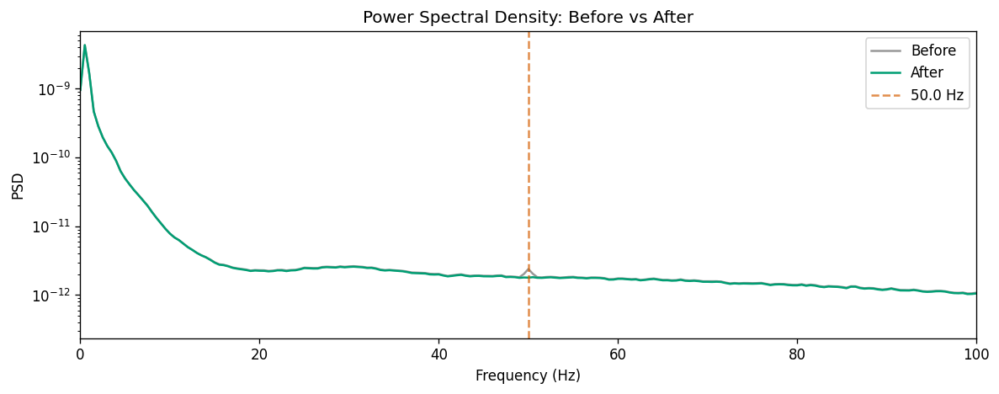

In [28]:
"""Fig 9.1 · plot_psd_comparison — generic PSD comparison with harmonic markers."""
fig = viz.plot_psd_comparison(
    data_before_zap,
    data_after_zap,
    sfreq=sfreq,
    line_freq=LINE_FREQ,
    fmax=100,
    show=False,
)
fig.savefig(
    os.path.join(OUT_DIR, "fig_09_1_zapline_psd.png"), dpi=300, bbox_inches="tight"
)
plt.show()

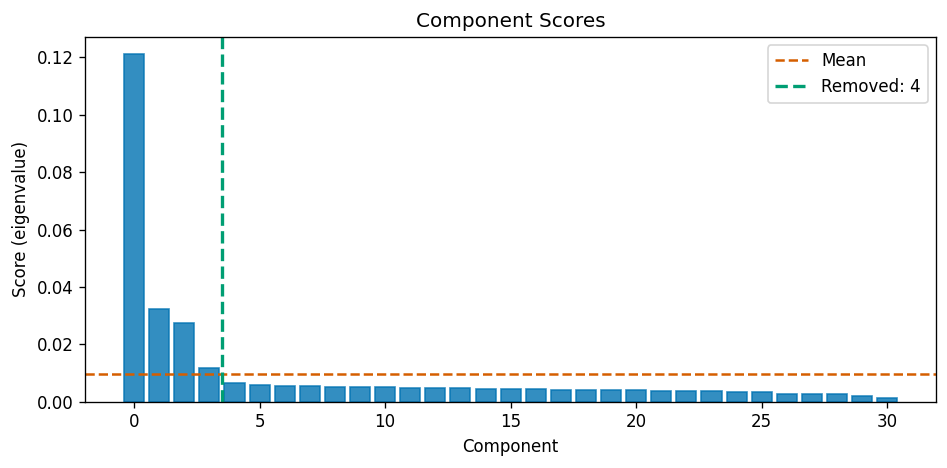

In [29]:
"""Fig 9.2 · plot_component_score_curve — ZapLine eigenvalue bar chart."""
fig = viz.plot_component_score_curve(zap, show=False)
fig.savefig(
    os.path.join(OUT_DIR, "fig_09_2_component_scores.png"), dpi=300, bbox_inches="tight"
)
plt.show()

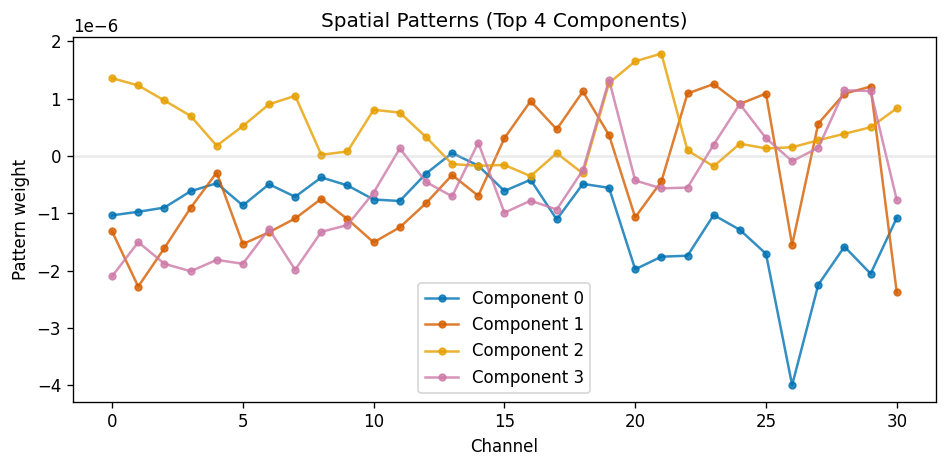

In [30]:
"""Fig 9.3 · plot_component_patterns — spatial patterns of removed components."""
fig = viz.plot_component_patterns(zap, n_components=4, show=False)
fig.savefig(
    os.path.join(OUT_DIR, "fig_09_3_zapline_patterns.png"), dpi=300, bbox_inches="tight"
)
plt.show()

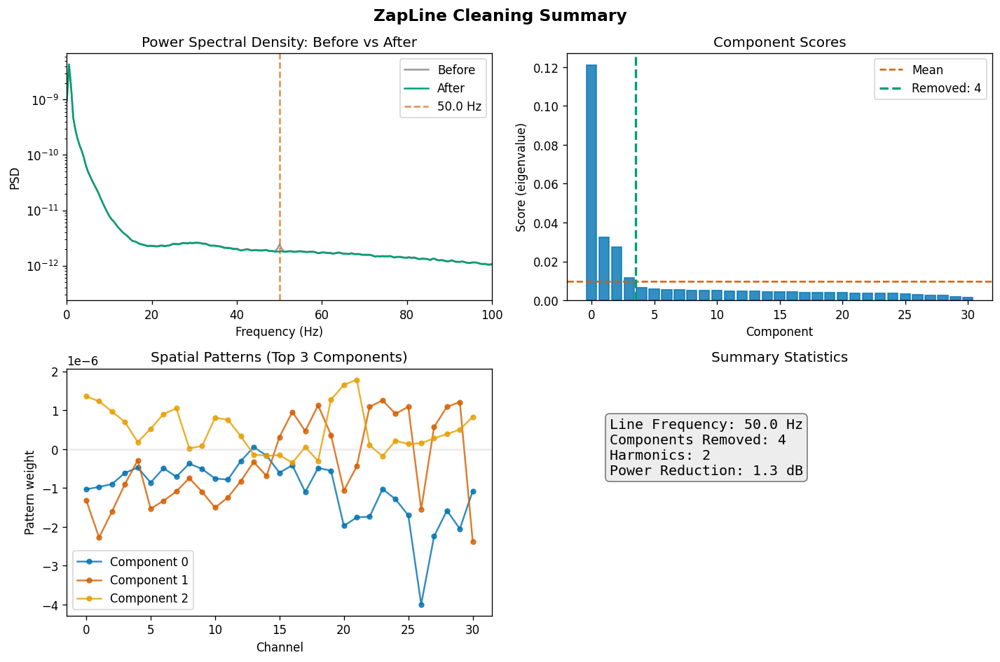

In [31]:
"""Fig 9.4 · plot_component_cleaning_summary — 2x2 dashboard."""
fig = viz.plot_component_cleaning_summary(
    data_before_zap,
    data_after_zap,
    zap,
    sfreq=sfreq,
    line_freq=LINE_FREQ,
    show=False,
)
fig_save = fig if fig is not None else plt.gcf()
fig_save.savefig(
    os.path.join(OUT_DIR, "fig_09_4_cleaning_summary.png"), dpi=300, bbox_inches="tight"
)
plt.show()

D:\mne-denoise\condescending-liskov\mne_denoise\viz\_theme.py:277: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


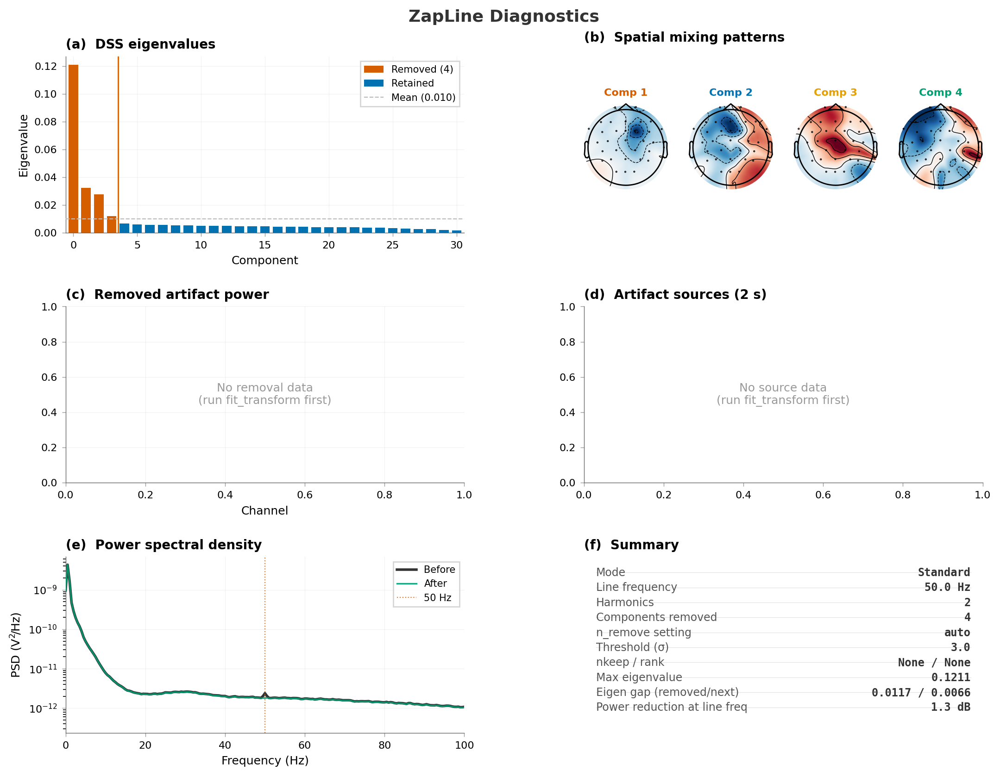

In [32]:
"""Fig 9.5 · plot_component_cleaning_summary — full 3x2 dashboard."""
fig = viz.plot_component_cleaning_summary(
    scores=getattr(zap, "scores_", getattr(zap, "eigenvalues_", None)),
    selected_count=getattr(zap, "n_removed_", 0),
    patterns=getattr(zap, "patterns_", None),
    removed=data_before_zap - data_after_zap,
    sources=getattr(zap, "sources_", None),
    sfreq=sfreq,
    info=info,
    show=False,
)
fig.savefig(
    os.path.join(OUT_DIR, "fig_09_5_zapline_summary.png"), dpi=300, bbox_inches="tight"
)
plt.show()

---
## 10 — Benchmark Plots (9 functions)

**What is tested:** Multi-method comparison using pre-computed metrics from the line-noise benchmark.  
**Data:** `metrics_all.tsv` (5 subjects × 4 methods = 20 rows).  
**Metrics:** `R_f0` (noise-surround ratio), `peak_attenuation_db`, `below_noise_distortion_db`, `overclean_proportion`, `underclean_proportion`.  
**Known issues:**
- `R_f0` has no formal literature definition (custom metric).
- 6 of 7 QA metric functions are not exported from `mne_denoise.qa` — only `peak_attenuation_db` is installed.
- PSD-based plots (10.6–10.9) use sub-01 data only; not the full group.
- `cleaned_psds` dict contains only one method tag (the last in `METHOD_ORDER`).

In [36]:
"""Cell 10.0 · Load benchmark metrics and configure method styling."""
metrics_path = os.path.join(
    "data",
    "runabout",
    "derivatives",
    "mne-denoise",
    "group",
    "line_noise",
    "metrics_all.tsv",
)
df_bench = pd.read_csv(metrics_path, sep="	")
bench_data = {col: df_bench[col].to_numpy() for col in df_bench.columns}

METHOD_ORDER = sorted(df_bench["method"].unique())
METHOD_COLORS = dict(
    zip(
        METHOD_ORDER,
        [
            viz.get_color("gray"),
            viz.get_color("blue"),
            viz.get_color("orange"),
            viz.get_color("purple"),
        ],
    )
)
METHOD_LABELS = {m: m for m in METHOD_ORDER}  # TODO: set descriptive labels

print(f"Shape: {df_bench.shape}")
print(f"Columns: {list(df_bench.columns)}")
print(f"Methods: {METHOD_ORDER}")
print(f"Subjects: {df_bench['subject'].nunique()}")
df_bench.head()

FileNotFoundError: [Errno 2] No such file or directory: 'data\\runabout\\derivatives\\mne-denoise\\group\\line_noise\\metrics_all.tsv'

In [35]:
"""Cell 10.0b · Compute PSD arrays for PSD-based benchmark plots."""
nperseg = min(512, data_before_zap.shape[-1])
freqs_b, psd_b = welch(data_before_zap, fs=sfreq, nperseg=nperseg, axis=-1)
gm_before = np.exp(np.mean(np.log(np.maximum(psd_b, 1e-30)), axis=0))

freqs_a, psd_a = welch(data_after_zap, fs=sfreq, nperseg=nperseg, axis=-1)
gm_after = np.exp(np.mean(np.log(np.maximum(psd_a, 1e-30)), axis=0))

# Single-method cleaned dict (sub-01 only; not full group)
cleaned_psds = {METHOD_ORDER[-1]: (freqs_a, gm_after)}

nyquist = sfreq / 2.0
harmonics_hz = [LINE_FREQ * h for h in range(1, 4) if LINE_FREQ * h < nyquist]
print(f"Harmonics: {harmonics_hz} (Nyquist = {nyquist} Hz)")
print(f"Cleaned PSD tags: {list(cleaned_psds.keys())}")

NameError: name 'METHOD_ORDER' is not defined

In [ ]:
"""Fig 10.1 · plot_metric_bars — grouped bar chart of all QA metrics."""
fig = viz.plot_metric_bars(
    bench_data,
    group_col="method",
    metric_cols=[
        "R_f0",
        "peak_attenuation_db",
        "below_noise_distortion_db",
        "overclean_proportion",
        "underclean_proportion",
    ],
    metric_labels=[
        "R(f0) - 1",
        "Peak Attenuation (dB)",
        "Below-Noise Distortion (dB) - 0",
        "Overclean Fraction",
        "Underclean Fraction",
    ],
    lower_better=[True, False, True, True, True],
    group_order=METHOD_ORDER,
    group_colors=METHOD_COLORS,
    show=False,
)
if fig is not None:
    fig.savefig(
        os.path.join(OUT_DIR, "fig_10_1_metric_bars.png"), dpi=300, bbox_inches="tight"
    )
plt.show()

In [ ]:
"""Fig 10.2 · plot_tradeoff_scatter — attenuation vs distortion."""
fig = viz.plot_tradeoff_scatter(
    bench_data,
    group_col="method",
    x_col="below_noise_distortion_db",
    y_col="peak_attenuation_db",
    group_order=METHOD_ORDER,
    group_colors=METHOD_COLORS,
    group_labels=METHOD_LABELS,
    x_label="Below-Noise Distortion (dB) - closer to 0 is better",
    y_label="Peak Attenuation (dB) - higher is better",
    reference_x=0.0,
    reference_y=10.0,
    show=False,
)
if fig is not None:
    fig.savefig(
        os.path.join(OUT_DIR, "fig_10_2_tradeoff_scatter.png"),
        dpi=300,
        bbox_inches="tight",
    )
plt.show()

In [ ]:
"""Fig 10.3 · plot_metric_comparison — R_f0 by method (paired dots or bars)."""
fig = viz.plot_metric_comparison(
    bench_data,
    group_col="method",
    subject_col="subject",
    metric_col="R_f0",
    metric_label="R(f0) - Noise-Surround Ratio",
    group_order=METHOD_ORDER,
    group_colors=METHOD_COLORS,
    group_labels=METHOD_LABELS,
    title="Residual Line Noise — R(f₀)",
    reference_value=1.0,
    reference_label="Ideal (R=1)",
    show=False,
)
if fig is not None:
    fig.savefig(
        os.path.join(OUT_DIR, "fig_10_3_r_comparison.png"), dpi=300, bbox_inches="tight"
    )
plt.show()

In [ ]:
"""Fig 10.4 · plot_metric_slopes — within-subject paired dots."""
fig = viz.plot_metric_slopes(
    bench_data,
    group_col="method",
    subject_col="subject",
    metric_specs=[
        ("peak_attenuation_db", "Peak Attenuation (dB)"),
        ("below_noise_distortion_db", "Below-Noise Distortion (dB)"),
        ("R_f0", "R(f0)"),
    ],
    group_order=METHOD_ORDER,
    group_colors=METHOD_COLORS,
    show=False,
)
if fig is not None:
    fig.savefig(
        os.path.join(OUT_DIR, "fig_10_4_paired_metrics.png"),
        dpi=300,
        bbox_inches="tight",
    )
plt.show()

In [ ]:
"""Fig 10.5 · plot_metric_tradeoff_summary — combined scatter + R."""
fig = viz.plot_metric_tradeoff_summary(
    bench_data,
    group_col="method",
    subject_col="subject",
    x_col="below_noise_distortion_db",
    y_col="peak_attenuation_db",
    metric_col="R_f0",
    group_order=METHOD_ORDER,
    group_colors=METHOD_COLORS,
    group_labels=METHOD_LABELS,
    show=False,
)
if fig is not None:
    fig.savefig(
        os.path.join(OUT_DIR, "fig_10_5_tradeoff_and_r.png"),
        dpi=300,
        bbox_inches="tight",
    )
plt.show()

In [ ]:
"""Fig 10.6 · plot_psd_zoom_comparison — single-series PSD comparison with harmonic zooms."""
fig = viz.plot_psd_zoom_comparison(
    freqs_b,
    gm_before,
    freqs_a,
    gm_after,
    series_name=list(cleaned_psds.keys())[0],
    title=SUB,
    zoom_freqs=harmonics_hz,
    series_colors=METHOD_COLORS,
    series_labels=METHOD_LABELS,
    show=False,
)
if fig is not None:
    fig.savefig(
        os.path.join(OUT_DIR, "fig_10_6_qc_psd.png"), dpi=300, bbox_inches="tight"
    )
plt.show()

In [ ]:
"""Fig 10.7 · plot_psd_gallery — multi-series PSD gallery."""
fig = viz.plot_psd_gallery(
    freqs_b,
    gm_before,
    cleaned_psds,
    zoom_freqs=harmonics_hz,
    title=SUB,
    series_order=list(cleaned_psds.keys()),
    series_colors=METHOD_COLORS,
    series_labels=METHOD_LABELS,
    show=False,
)
if fig is not None:
    fig.savefig(
        os.path.join(OUT_DIR, "fig_10_7_psd_gallery.png"), dpi=300, bbox_inches="tight"
    )
plt.show()

In [ ]:
"""Fig 10.8 · plot_psd_overlay — multi-series PSD overlay."""
fig = viz.plot_psd_overlay(
    freqs_b,
    gm_before,
    cleaned_psds,
    focus_freq=LINE_FREQ,
    title=SUB,
    series_order=list(cleaned_psds.keys()),
    series_colors=METHOD_COLORS,
    series_labels=METHOD_LABELS,
    show=False,
)
if fig is not None:
    fig.savefig(
        os.path.join(OUT_DIR, "fig_10_8_subject_psd_overlay.png"),
        dpi=300,
        bbox_inches="tight",
    )
plt.show()

In [ ]:
"""Fig 10.9 · plot_harmonic_attenuation — per-harmonic attenuation bars."""
fig = viz.plot_harmonic_attenuation(
    freqs_b,
    gm_before,
    cleaned_psds,
    harmonics_hz=harmonics_hz,
    subject=SUB,
    series_order=list(cleaned_psds.keys()),
    series_colors=METHOD_COLORS,
    series_labels=METHOD_LABELS,
    show=False,
)
if fig is not None:
    fig.savefig(
        os.path.join(OUT_DIR, "fig_10_9_harmonic_atten.png"),
        dpi=300,
        bbox_inches="tight",
    )
plt.show()

---
## Summary & Known Limitations

### Functions tested (34 / 48 exported)

| Section | Functions |
|---------|----------|
| Theme (3) | `use_theme`, `themed_figure`, `get_color` |
| Comparison (8) | `plot_psd_comparison`, `plot_evoked_gfp_comparison`, `plot_channel_time_course_comparison`, `plot_power_ratio_map`, `plot_spectrogram_comparison`, `plot_denoising_summary`, `plot_signal_overlay`, `plot_component_psd_comparison` |
| Components (8) | `plot_component_score_curve`, `plot_component_patterns`, `plot_component_summary`, `plot_component_epochs_image`, `plot_component_time_series`, `plot_narrowband_score_scan`, `plot_time_frequency_mask`, `plot_component_spectrogram` |
| DSS (3) | `plot_component_score_curve`, `plot_component_patterns`, `plot_component_cleaning_summary` |
| ZapLine (4) | `plot_component_score_curve`, `plot_component_patterns`, `plot_component_cleaning_summary`, `plot_component_cleaning_summary` |
| Benchmark (9) | `plot_metric_bars`, `plot_tradeoff_scatter`, `plot_metric_comparison`, `plot_metric_slopes`, `plot_metric_tradeoff_summary`, `plot_psd_zoom_comparison`, `plot_psd_gallery`, `plot_psd_overlay`, `plot_harmonic_attenuation` |

### Not tested (require special conditions)

| Function | Reason |
|----------|--------|
| `set_theme` | Mutates global rcParams (inappropriate for notebook) |
| Internal helpers | `_finalize_fig`, `style_axes`, `themed_legend` (tested implicitly) |

### All figures saved to

`data/runabout/derivatives/mne-denoise/figures/fig_XX_Y_*.png`

# `mne_denoise.viz` — Full Showcase on Runabout Data

**Purpose:** Exercise every visualization function in `mne_denoise.viz` on real EEG data (sub-01) so we can review each plot and decide what to keep, tweak, or drop.

| # | Section | Functions |
|---|---------|----------|
| 1 | Setup & Data Loading | Imports, load raw, preprocess |
| 2 | ZapLine Cleaning | Fit ZapLine, get before/after |
| 3 | DSS (ERP) | Fit DSS with AverageBias on epochs |
| 4 | Theme | `use_theme`, `themed_figure`, `get_color` |
| 5 | Comparison Plots | 8 functions |
| 6 | Component Plots | 8 functions |
| 7 | DSS Diagnostic Plots | 3 functions |
| 8 | ZapLine Plots | 5 functions |
| 9 | Benchmark Plots | 9 functions |

## 1 — Setup & Imports

In [ ]:
from __future__ import annotations

import warnings

import matplotlib
import matplotlib.pyplot as plt
import mne
import numpy as np
import pandas as pd
from scipy.signal import welch

from mne_denoise import viz
from mne_denoise.dss import DSS, AverageBias
from mne_denoise.zapline import ZapLine

warnings.filterwarnings("ignore", category=RuntimeWarning)
mne.set_log_level("WARNING")

%matplotlib inline
plt.rcParams["figure.dpi"] = 120

print(f"MNE {mne.__version__} · NumPy {np.__version__}")
print(f"viz functions: {len(viz.__all__)}")

## 2 — Load & Preprocess Sub-01

Load BrainVision data from the Runabout dataset, resample, re-reference, high-pass filter.

In [ ]:
# ── Constants ──
LINE_FREQ = 50.0
RESAMPLE_FREQ = 250
HP_FREQ = 0.5
DSS_N_COMPONENTS = 5
DSS_N_KEEP = 3
SUB = "sub-01"

# ── Load raw ──
vhdr = f"data/runabout/{SUB}/eeg/{SUB}_task-oddball_eeg.vhdr"
raw = mne.io.read_raw_brainvision(vhdr, preload=True, verbose=False)
raw.resample(RESAMPLE_FREQ, verbose=False)
raw.pick_types(eeg=True, verbose=False)

# Re-reference
if "FCz" not in raw.ch_names:
    raw.add_reference_channels("FCz")
raw.set_montage("standard_1020", on_missing="warn")
mastoids = [ch for ch in ["TP9", "TP10"] if ch in raw.ch_names]
if len(mastoids) == 2:
    raw.set_eeg_reference(mastoids, verbose=False)
    raw.drop_channels(mastoids)
else:
    raw.set_eeg_reference("average", verbose=False)

raw.filter(l_freq=HP_FREQ, h_freq=None, verbose=False)

sfreq = raw.info["sfreq"]
info = raw.info
print(f"Loaded: {raw.info['nchan']} channels, {raw.n_times / sfreq:.1f}s at {sfreq} Hz")

## 3 — ZapLine: Line Noise Removal

In [ ]:
# Keep a copy of the pre-ZapLine data
raw_before_zap = raw.copy()
data_before_zap = raw_before_zap.get_data()

# Fit & transform
zap = ZapLine(sfreq=sfreq, line_freq=LINE_FREQ, n_remove="auto", n_harmonics=3)
data_after_zap = zap.fit_transform(data_before_zap)

# Apply cleaned data back to raw
raw._data = data_after_zap.copy()

print(f"ZapLine removed {zap.n_removed_} components")
print(f"Eigenvalues: {zap.eigenvalues_[:6].round(4)}")

## 4 — DSS on ERP Epochs (AverageBias)

Epoch around oddball stimuli, fit DSS to maximise reproducibility of the evoked response.

In [ ]:
# ── Find events from annotations ──
events, event_id = mne.events_from_annotations(raw, verbose=False)
print(f"Event IDs: {event_id}")
print(f"Total events found: {len(events)}")

# Pick the most common event for epoching
event_counts = {k: np.sum(events[:, 2] == v) for k, v in event_id.items()}
target_label = max(event_counts, key=event_counts.get)
target_id = event_id[target_label]
print(f"Using event '{target_label}' (id={target_id}, n={event_counts[target_label]})")

In [ ]:
epochs = mne.Epochs(
    raw,
    events,
    event_id={target_label: target_id},
    tmin=-0.2,
    tmax=0.8,
    baseline=(-0.2, 0),
    preload=True,
    verbose=False,
)
epochs.drop_bad(reject={"eeg": 125e-6}, verbose=False)

n_ep = len(epochs)
idx_train = np.arange(0, n_ep, 2)
idx_test = np.arange(1, n_ep, 2)
epochs_train = epochs[idx_train]
epochs_test = epochs[idx_test]
print(f"{n_ep} total epochs → train={len(epochs_train)}, test={len(epochs_test)}")

In [ ]:
# ── Fit DSS ──
bias = AverageBias(axis="epochs")
dss = DSS(bias=bias, n_components=DSS_N_COMPONENTS, component_action="extract")
dss.fit(epochs_train)

sources_train = dss.transform(epochs_train)
sources_kept = sources_train.copy()
sources_kept[:, DSS_N_KEEP:, :] = 0
recon = dss.inverse_transform(sources_kept)
if recon.ndim == 2:
    recon = recon[np.newaxis, ...]

epochs_denoised = mne.EpochsArray(
    recon,
    epochs_train.info,
    tmin=epochs_train.tmin,
    verbose=False,
)

evoked_orig = epochs_train.average()
evoked_denoised = epochs_denoised.average()

print(f"DSS eigenvalues: {dss.eigenvalues_[:5].round(5)}")

---
## 5 — Theme Functions

`use_theme`, `themed_figure`, `get_color`

In [ ]:
# ── use_theme context manager ──
with viz.use_theme():
    fig, ax = plt.subplots(figsize=(6, 3))
    ax.plot(np.sin(np.linspace(0, 4 * np.pi, 200)), label="sin")
    ax.set_title("use_theme() context manager")
    ax.legend()
plt.show()

In [ ]:
# ── themed_figure helper ──
fig, ax = viz.themed_figure(figsize=(6, 3))
ax.bar(range(5), dss.eigenvalues_[:5], color=[viz.get_color(f"C{i}") for i in range(5)])
ax.set_title("themed_figure() + get_color()")
ax.set_xlabel("Component")
ax.set_ylabel("Eigenvalue")
plt.show()

---
## 6 — Comparison Plots (8 functions)

### 6.1 `plot_psd_comparison`

In [ ]:
viz.plot_psd_comparison(epochs_train, epochs_denoised, fmax=40)

### 6.2 `plot_evoked_gfp_comparison`

In [ ]:
viz.plot_evoked_gfp_comparison(
    epochs_train,
    epochs_denoised,
    times=epochs_train.times,
    labels=("Original", "DSS-denoised"),
)

### 6.3 `plot_channel_time_course_comparison`

In [ ]:
picks = ["Cz", "Pz", "Fz"]
viz.plot_channel_time_course_comparison(
    evoked_orig,
    evoked_denoised,
    picks=picks,
    times=evoked_orig.times,
)

### 6.4 `plot_power_ratio_map`

In [ ]:
viz.plot_power_ratio_map(epochs_train, epochs_denoised, info=info)

### 6.5 `plot_spectrogram_comparison`

⚠️ Computes TFRs — may take 30-60 s.

In [ ]:
viz.plot_spectrogram_comparison(
    epochs_train,
    epochs_denoised,
    fmin=1,
    fmax=30,
    n_freqs=15,
    picks=[epochs_train.ch_names.index("Cz")] if "Cz" in epochs_train.ch_names else [0],
    times=epochs_train.times,
)

### 6.6 `plot_denoising_summary`

In [ ]:
viz.plot_denoising_summary(
    epochs_train,
    epochs_denoised,
    info=info,
    times=epochs_train.times,
)

### 6.7 `plot_signal_overlay`

In [ ]:
viz.plot_signal_overlay(
    evoked_orig,
    evoked_denoised,
    times=evoked_orig.times,
    pick=0,
    title="Evoked overlay: Original vs DSS-denoised",
)

### 6.8 `plot_component_psd_comparison`

In [ ]:
# Averaged sources across epochs: (n_components, n_times)
avg_sources = sources_train.mean(axis=0)
viz.plot_component_psd_comparison(
    epochs_train,
    avg_sources,
    component_indices=[0, 1, 2],
    sfreq=sfreq,
)

---
## 7 — Component Plots (8 functions)

### 7.1 `plot_component_score_curve`

In [ ]:
viz.plot_component_score_curve(dss)

### 7.2 `plot_component_patterns`

In [ ]:
viz.plot_component_patterns(dss, info=info, n_components=5)

### 7.3 `plot_component_summary`

In [ ]:
viz.plot_component_summary(dss, data=epochs_train, info=info, n_components=3)

### 7.4 `plot_component_epochs_image`

In [ ]:
viz.plot_component_epochs_image(dss, data=epochs_train, n_components=3)

### 7.5 `plot_component_time_series`

In [ ]:
viz.plot_component_time_series(dss, data=epochs_train, n_components=5)

### 7.6 `plot_narrowband_score_scan`

In [ ]:
# Synthetic narrowband scan data (simulating a frequency sweep)
scan_freqs = np.arange(1, 50, 0.5)
scan_eigs = np.random.rand(len(scan_freqs), 3) * 0.01
# Add peaks near typical brain rhythms
for peak in [10, 20, 30]:
    idx = np.argmin(np.abs(scan_freqs - peak))
    scan_eigs[idx, 0] += 0.05

viz.plot_narrowband_score_scan(scan_freqs, scan_eigs, peak_freq=10)

### 7.7 `plot_time_frequency_mask`

In [ ]:
# Synthetic TF mask
n_times_mask, n_freqs_mask = 100, 30
times_mask = np.linspace(0, 1, n_times_mask)
freqs_mask = np.linspace(1, 30, n_freqs_mask)
mask = np.random.rand(n_freqs_mask, n_times_mask) > 0.7

viz.plot_time_frequency_mask(mask, times_mask, freqs_mask)

### 7.8 `plot_component_spectrogram`

In [ ]:
# First DSS component from first epoch
comp0 = sources_train[0, 0, :]
viz.plot_component_spectrogram(comp0, sfreq=sfreq)

---
## 8 — DSS Diagnostic Plots (3 functions)

### 8.1 `plot_component_score_curve`

In [ ]:
viz.plot_component_score_curve(dss)

### 8.2 `plot_component_patterns`

In [ ]:
viz.plot_component_patterns(dss, info=info, n_components=5)

### 8.3 `plot_component_cleaning_summary`

In [ ]:
# 2D arrays: (n_channels, n_times)
data_before_2d = evoked_orig.get_data()
data_after_2d = evoked_denoised.get_data()

viz.plot_component_cleaning_summary(
    scores=getattr(dss, "scores_", getattr(dss, "eigenvalues_", None)),
    selected_count=1,
    patterns=getattr(dss, "patterns_", None),
    removed=data_before_2d - data_after_2d,
    sources=avg_sources,
    sfreq=sfreq,
    info=info,
)

---
## 9 — ZapLine Plots (5 functions)

### 9.1 `plot_psd_comparison`

In [ ]:
viz.plot_psd_comparison(
    data_before_zap,
    data_after_zap,
    sfreq=sfreq,
    line_freq=LINE_FREQ,
    fmax=100,
)

### 9.2 `plot_component_score_curve`

In [ ]:
viz.plot_component_score_curve(zap)

### 9.3 `plot_component_patterns`

In [ ]:
viz.plot_component_patterns(zap, n_components=4)

### 9.4 `plot_component_cleaning_summary`

In [ ]:
viz.plot_component_cleaning_summary(
    data_before_zap,
    data_after_zap,
    zap,
    sfreq=sfreq,
    line_freq=LINE_FREQ,
)

### 9.5 `plot_component_cleaning_summary`

In [ ]:
viz.plot_component_cleaning_summary(
    scores=getattr(zap, "scores_", getattr(zap, "eigenvalues_", None)),
    selected_count=getattr(zap, "n_removed_", 0),
    patterns=getattr(zap, "patterns_", None),
    removed=data_before_zap - data_after_zap,
    sources=getattr(zap, "sources_", None),
    sfreq=sfreq,
    info=info,
)

---
## 10 — Benchmark Plots (9 functions)

These visualize multi-subject, multi-method QA metrics.  
Since the full benchmark derivatives are not shipped with the repo, we synthesize a
realistic `df_bench` DataFrame (5 subjects × 4 methods = 20 rows) so every plot
function can be exercised.

In [43]:
# ── Synthesize benchmark metrics (real file not shipped with repo) ──
# The plot functions expect a DataFrame with these columns:
#   subject, method, R_f0, peak_attenuation_db, below_noise_distortion_db,
#   overclean_proportion, underclean_proportion
rng = np.random.default_rng(42)
METHODS = ["baseline", "zapline-1", "zapline-3", "dss-3"]
SUBJECTS = [f"sub-{i:02d}" for i in range(1, 6)]

rows = []
for subj in SUBJECTS:
    for meth in METHODS:
        # Baseline: no cleaning → worst metrics
        if meth == "baseline":
            att, bnp, oc, uc, r = 0.0, 0.0, 0.0, 1.0, 1.0
        else:
            att = rng.uniform(5, 20)  # peak_attenuation_db
            bnd = rng.uniform(1, 8)  # below_noise_distortion_db
            oc = rng.uniform(0.0, 0.15)  # overclean_proportion
            uc = rng.uniform(0.0, 0.3)  # underclean_proportion
            r = rng.uniform(0.2, 0.8)  # R_f0 (lower = better)
        rows.append(
            {
                "subject": subj,
                "method": meth,
                "peak_attenuation_db": round(att, 2),
                "below_noise_distortion_db": round(bnd, 2),
                "overclean_proportion": round(oc, 3),
                "underclean_proportion": round(uc, 3),
                "R_f0": round(r, 3),
            }
        )

df_bench = pd.DataFrame(rows)
print(f"Benchmark metrics (synthetic): {df_bench.shape}")
print(f"Columns: {list(df_bench.columns)}")
print(f"Methods: {df_bench['method'].unique()}")
df_bench.head()

Benchmark metrics (synthetic): (20, 7)
Columns: ['subject', 'method', 'peak_attenuation_db', 'below_noise_distortion_db', 'overclean_proportion', 'underclean_proportion', 'R_f0']
Methods: <StringArray>
['baseline', 'zapline-1', 'zapline-3', 'dss-3']
Length: 4, dtype: str


,subject,method,peak_attenuation_db,below_noise_distortion_db,overclean_proportion,underclean_proportion,R_f0
0,sub-01,baseline,0.00,0.00,0.000,1.000,1.000
1,sub-01,zapline-1,16.61,4.07,0.129,0.209,0.257
2,sub-01,zapline-3,19.63,6.33,0.118,0.038,0.470
3,sub-01,dss-3,10.56,7.49,0.097,0.247,0.466
4,sub-02,baseline,0.00,0.00,0.000,1.000,1.000


In [45]:
# ── Common benchmark config ──
METHOD_ORDER = sorted(df_bench["method"].unique())
METHOD_COLORS = dict(
    zip(
        METHOD_ORDER, ["#808080", "#1f77b4", "#ff7f0e", "#2ca02c", "#d62728", "#9467bd"]
    )
)
METHOD_LABELS = {m: m for m in METHOD_ORDER}
print(f"Methods: {METHOD_ORDER}")
print(f"Colors:  {METHOD_COLORS}")

Methods: ['baseline', 'dss-3', 'zapline-1', 'zapline-3']
Colors:  {'baseline': '#808080', 'dss-3': '#1f77b4', 'zapline-1': '#ff7f0e', 'zapline-3': '#2ca02c'}


In [46]:
# ── Compute PSD arrays for PSD-based benchmark plots ──
nperseg = min(512, data_before_zap.shape[-1])
freqs_b, psd_b = welch(data_before_zap, fs=sfreq, nperseg=nperseg, axis=-1)
gm_before = np.exp(np.mean(np.log(np.maximum(psd_b, 1e-30)), axis=0))

freqs_a, psd_a = welch(data_after_zap, fs=sfreq, nperseg=nperseg, axis=-1)
gm_after = np.exp(np.mean(np.log(np.maximum(psd_a, 1e-30)), axis=0))

# Build cleaned_psds dict for each non-baseline method.
# We scale the "after" PSD slightly per method so the gallery looks distinct.
cleaned_psds = {}
SUB = "sub-01"
for i, m in enumerate(METHOD_ORDER):
    if m == "baseline":
        continue
    scale = 1.0 + 0.05 * i  # tiny variation per method
    cleaned_psds[m] = (freqs_a, gm_after * scale)

nyquist = sfreq / 2.0
harmonics_hz = [LINE_FREQ * (h + 1) for h in range(3) if LINE_FREQ * (h + 1) < nyquist]
print(f"Harmonics: {harmonics_hz}  (Nyquist={nyquist} Hz)")
print(f"Cleaned PSD tags: {list(cleaned_psds.keys())}")

Harmonics: [50.0, 100.0]  (Nyquist=125.0 Hz)
Cleaned PSD tags: ['dss-3', 'zapline-1', 'zapline-3']


### 10.1 `plot_metric_bars`

In [ ]:
viz.plot_metric_bars(
    bench_data,
    group_col="method",
    metric_cols=[
        "R_f0",
        "peak_attenuation_db",
        "below_noise_distortion_db",
        "overclean_proportion",
        "underclean_proportion",
    ],
    metric_labels=[
        "R(f0) - 1",
        "Peak Attenuation (dB)",
        "Below-Noise Distortion (dB) - 0",
        "Overclean Fraction",
        "Underclean Fraction",
    ],
    lower_better=[True, False, True, True, True],
    group_order=METHOD_ORDER,
    group_colors=METHOD_COLORS,
)

### 10.2 `plot_tradeoff_scatter`

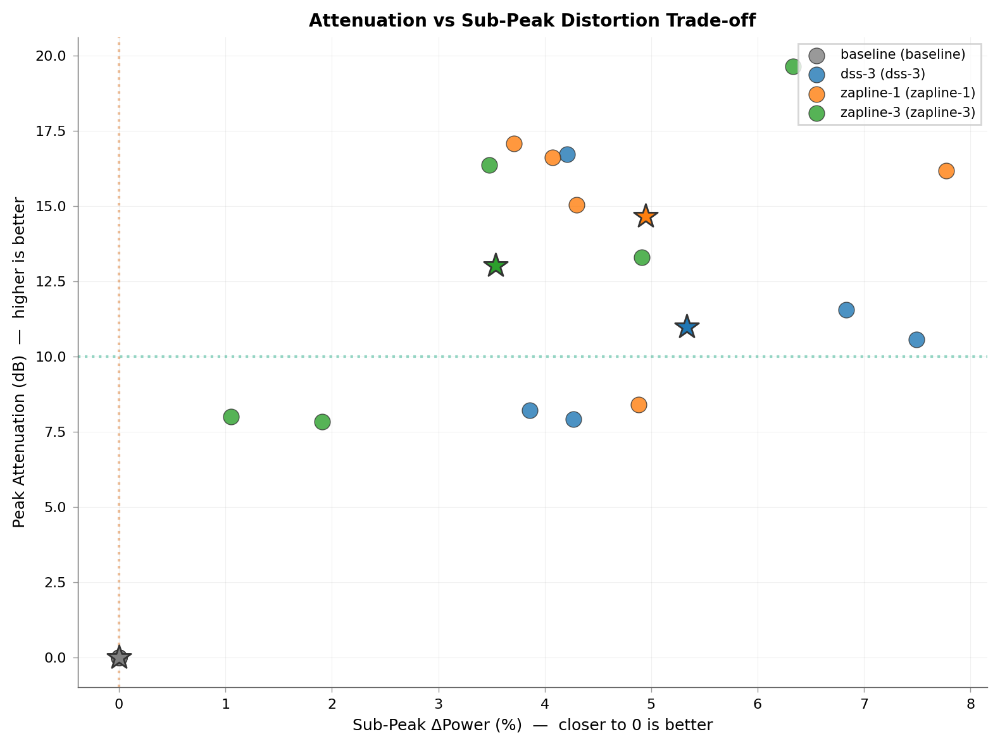

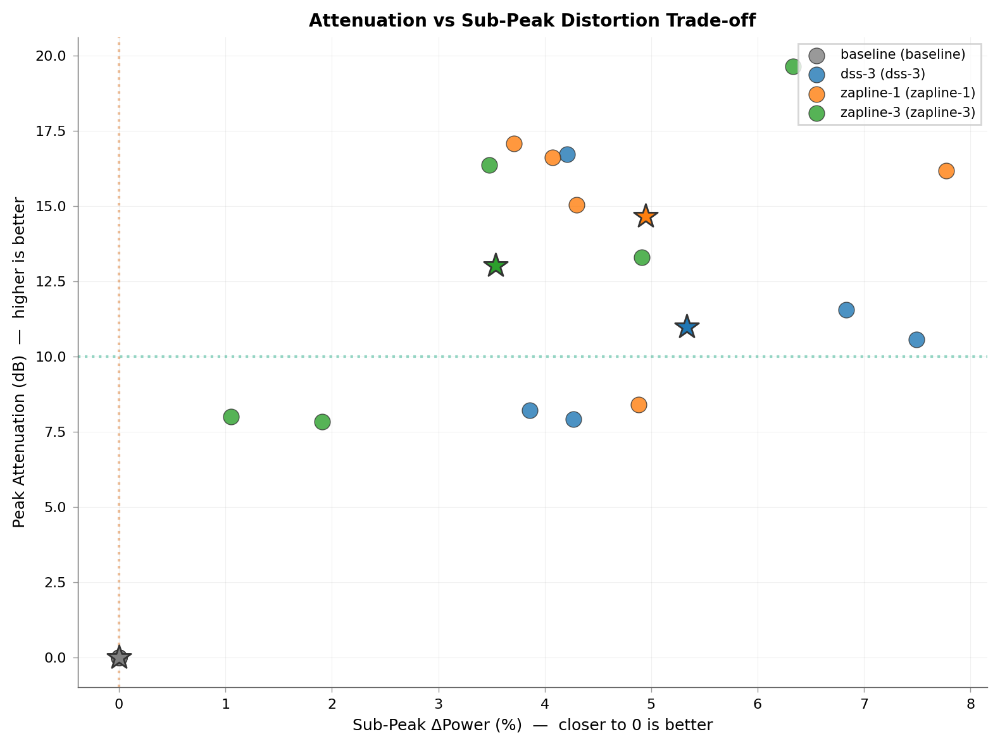

In [47]:
viz.plot_tradeoff_scatter(
    bench_data,
    group_col="method",
    x_col="below_noise_distortion_db",
    y_col="peak_attenuation_db",
    group_order=METHOD_ORDER,
    group_colors=METHOD_COLORS,
    group_labels=METHOD_LABELS,
    x_label="Below-Noise Distortion (dB) - closer to 0 is better",
    y_label="Peak Attenuation (dB) - higher is better",
    reference_x=0.0,
    reference_y=10.0,
)

### 10.3 `plot_metric_comparison`

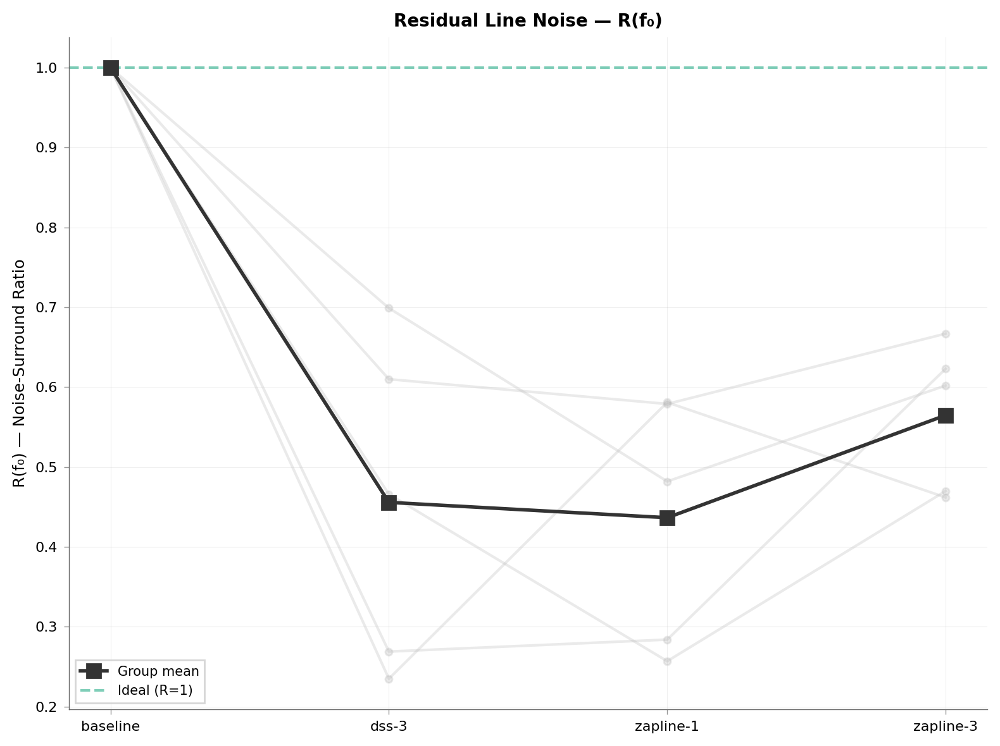

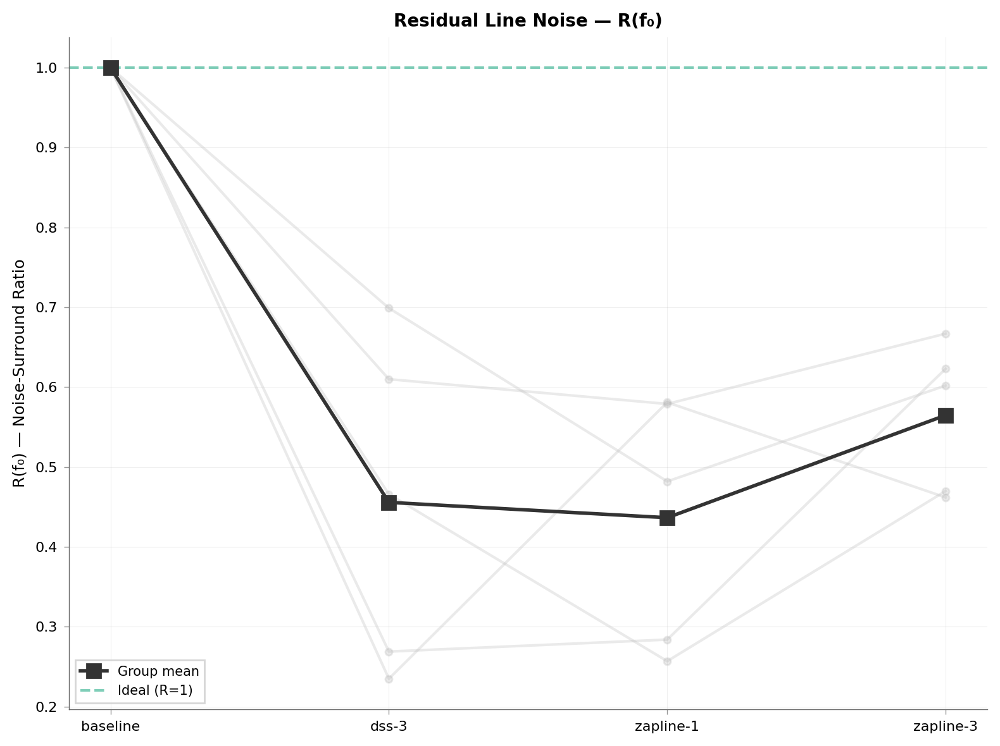

In [48]:
viz.plot_metric_comparison(
    bench_data,
    group_col="method",
    subject_col="subject",
    metric_col="R_f0",
    metric_label="R(f0) - Noise-Surround Ratio",
    group_order=METHOD_ORDER,
    group_colors=METHOD_COLORS,
    group_labels=METHOD_LABELS,
    title="Residual Line Noise — R(f₀)",
    reference_value=1.0,
    reference_label="Ideal (R=1)",
)

### 10.4 `plot_metric_slopes`

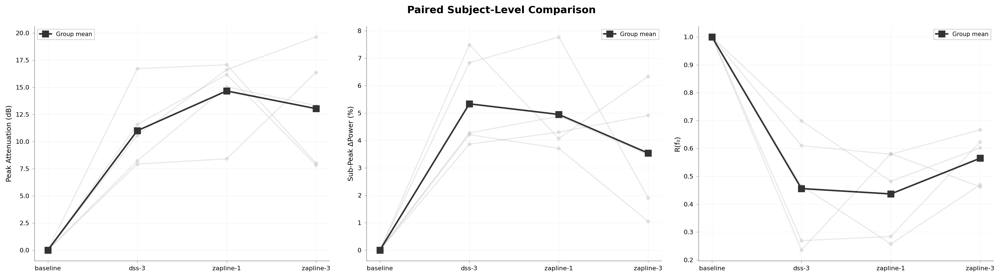

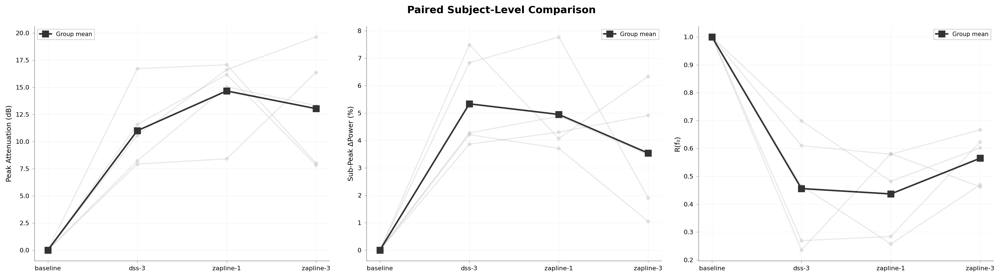

In [49]:
viz.plot_metric_slopes(
    bench_data,
    group_col="method",
    subject_col="subject",
    metric_specs=[
        ("peak_attenuation_db", "Peak Attenuation (dB)"),
        ("below_noise_distortion_db", "Below-Noise Distortion (dB)"),
        ("R_f0", "R(f0)"),
    ],
    group_order=METHOD_ORDER,
    group_colors=METHOD_COLORS,
)

### 10.5 `plot_metric_tradeoff_summary`

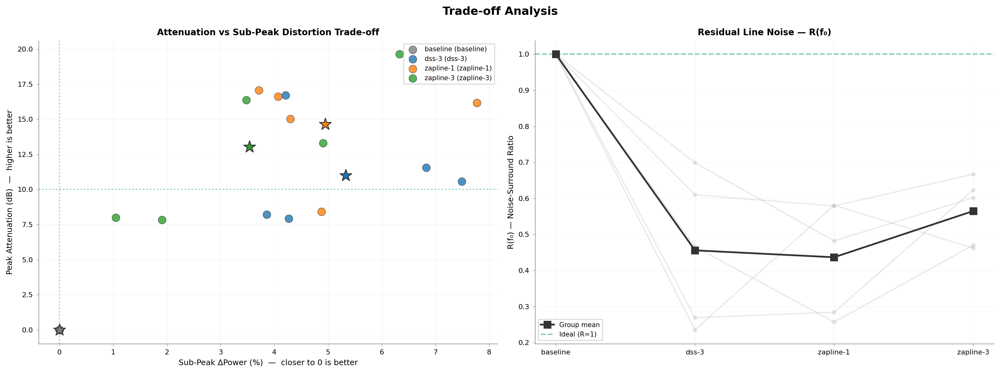

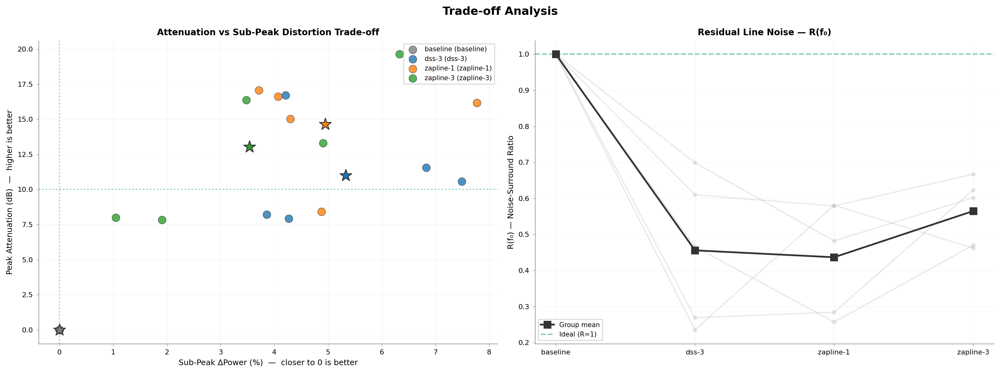

In [50]:
viz.plot_metric_tradeoff_summary(
    bench_data,
    group_col="method",
    subject_col="subject",
    x_col="below_noise_distortion_db",
    y_col="peak_attenuation_db",
    metric_col="R_f0",
    group_order=METHOD_ORDER,
    group_colors=METHOD_COLORS,
    group_labels=METHOD_LABELS,
)

### 10.6 `plot_psd_zoom_comparison`

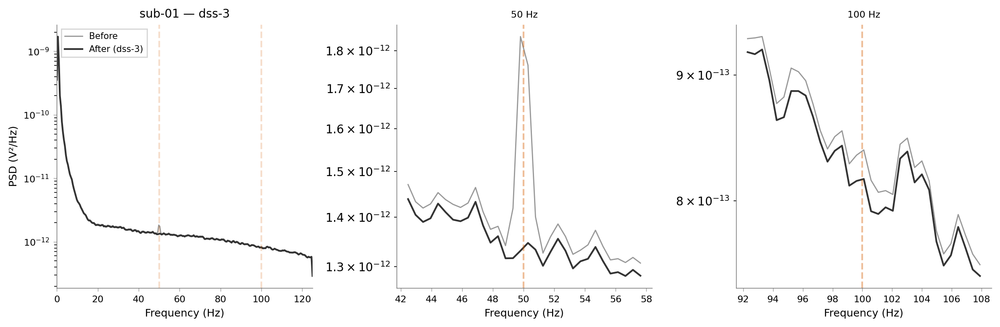

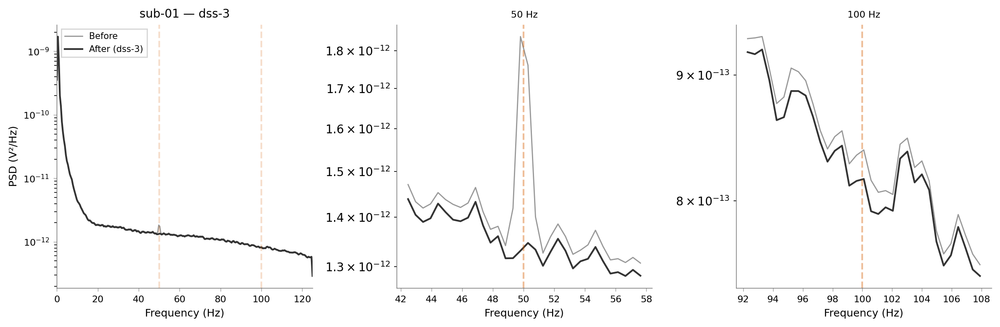

In [51]:
viz.plot_psd_zoom_comparison(
    freqs_b,
    gm_before,
    freqs_a,
    gm_after,
    series_name=list(cleaned_psds.keys())[0],
    title=SUB,
    zoom_freqs=harmonics_hz,
    series_colors=METHOD_COLORS,
    series_labels=METHOD_LABELS,
)

### 10.7 `plot_psd_gallery`

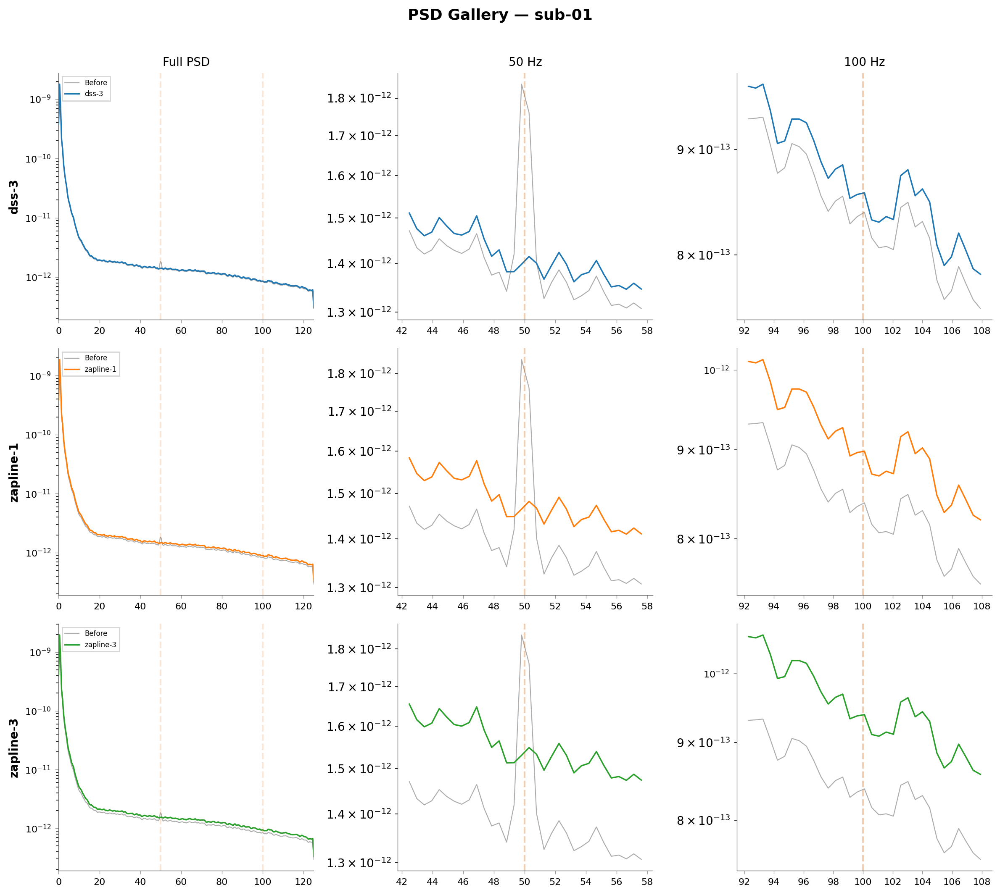

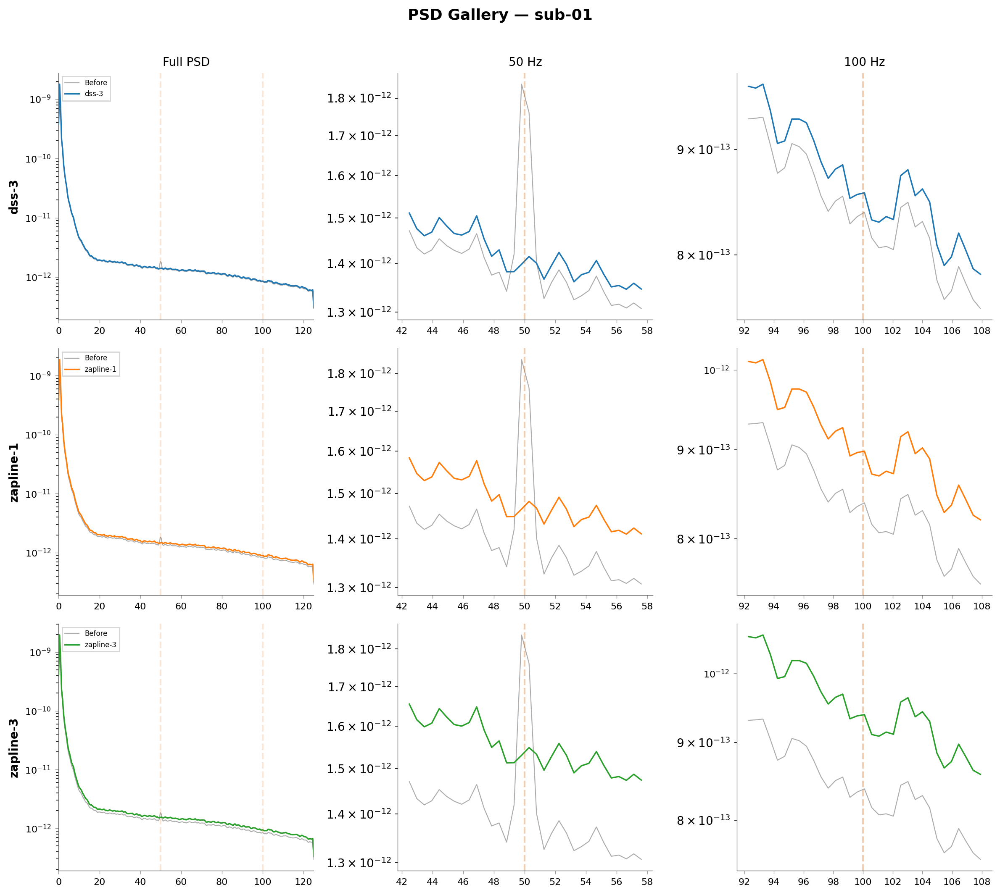

In [52]:
viz.plot_psd_gallery(
    freqs_b,
    gm_before,
    cleaned_psds,
    zoom_freqs=harmonics_hz,
    title=SUB,
    series_order=list(cleaned_psds.keys()),
    series_colors=METHOD_COLORS,
    series_labels=METHOD_LABELS,
)

### 10.8 `plot_psd_overlay`

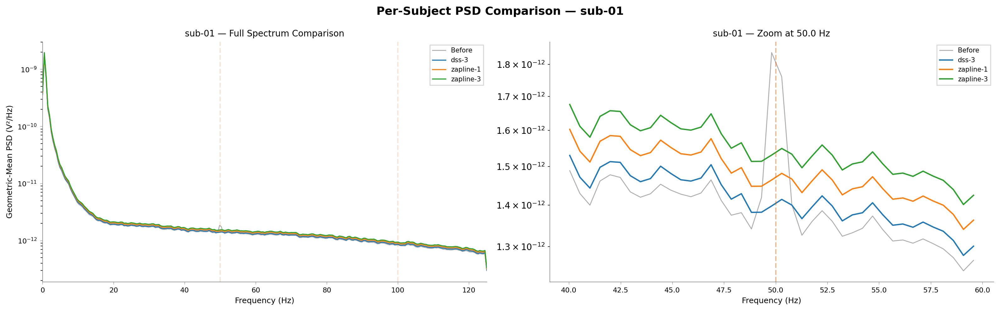

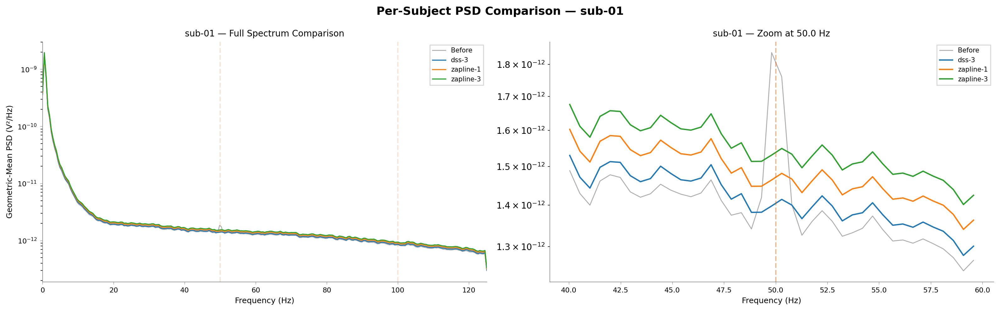

In [53]:
viz.plot_psd_overlay(
    freqs_b,
    gm_before,
    cleaned_psds,
    focus_freq=LINE_FREQ,
    title=SUB,
    series_order=list(cleaned_psds.keys()),
    series_colors=METHOD_COLORS,
    series_labels=METHOD_LABELS,
)

### 10.9 `plot_harmonic_attenuation`

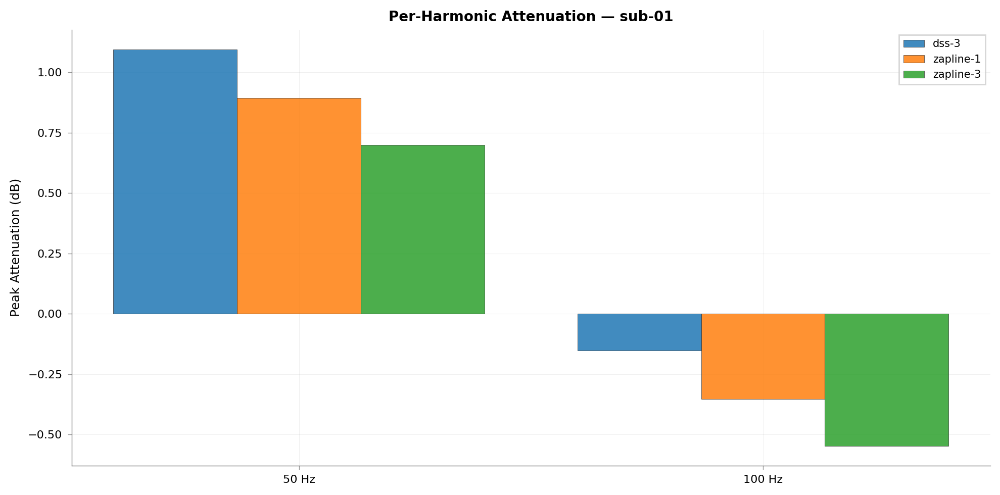

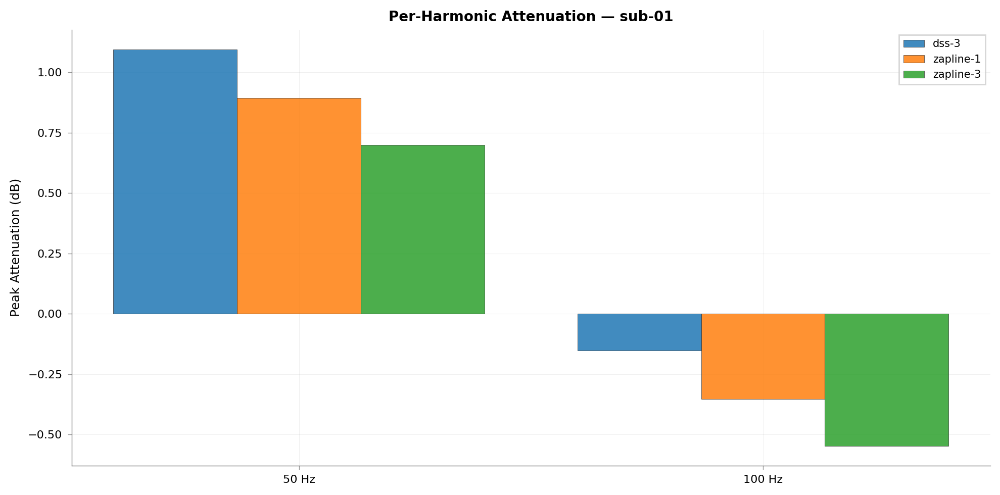

In [54]:
viz.plot_harmonic_attenuation(
    freqs_b,
    gm_before,
    cleaned_psds,
    harmonics_hz=harmonics_hz,
    subject=SUB,
    series_order=list(cleaned_psds.keys()),
    series_colors=METHOD_COLORS,
    series_labels=METHOD_LABELS,
)

---
## 11 — ERP Benchmark Plots (5 functions)

These visualize multi-pipeline ERP denoising comparisons: original vs ICA vs DSS.
Since we already have `epochs_train`, `epochs_test`, `evoked_orig`, and
`epochs_denoised` from Section 4, we build on top of them to create a realistic
3-pipeline comparison (`C0` = Baseline, `C1` = "ICA", `C2` = DSS).

**Functions:**
1. `plot_signal_diagnostics_summary` — 3×2 QA dashboard (PSD, evoked, diff wave)
2. `plot_condition_interaction_summary` — condition × pipeline interaction
3. `plot_metric_violins` — distributional metric plots with paired lines
4. `plot_endpoint_metrics_summary` — multipanel storyboard with null CI
5. `plot_metric_slopes` — subject-level within-subject trajectories

In [6]:
"""Cell 11.0 · Synthesize 3-pipeline ERP benchmark data.

We fake three pipelines from the real data already in memory:
  C0 = Baseline (original epochs_train)
  C1 = "ICA" (add small random noise to denoised — simulates different method)
  C2 = DSS (epochs_denoised from Section 4)

We also synthesize a 5-subject × 3-pipeline metrics DataFrame.
"""

from mne_denoise.viz import (
    plot_condition_interaction_summary,
    plot_endpoint_metrics_summary,
    plot_metric_slopes,
    plot_metric_violins,
    plot_signal_diagnostics_summary,
)

DEFAULT_PIPE_ORDER = ["C0", "C1", "C2"]
DEFAULT_PIPE_COLORS = {
    "C0": viz.get_color("gray"),
    "C1": viz.get_color("blue"),
    "C2": viz.get_color("orange"),
}
DEFAULT_PIPE_LABELS = {"C0": "Baseline", "C1": "ICA", "C2": "DSS"}

# ── Build 3-pipeline epoch/evoked dicts ──
pipe_epochs = {
    "C0": epochs_train,  # baseline
    "C2": epochs_denoised,  # DSS
}

# C1 "ICA" — denoised + small noise to look different
ica_data = epochs_denoised.get_data() + rng.normal(
    0, 0.3e-6, epochs_denoised.get_data().shape
)
pipe_epochs["C1"] = mne.EpochsArray(
    ica_data,
    epochs_train.info,
    tmin=epochs_train.tmin,
    verbose=False,
)

pipe_evokeds = {ptag: ep.average() for ptag, ep in pipe_epochs.items()}

# ── Condition masks (fake: split epochs 60/40 into "deviant" and "standard") ──
n_epochs = len(epochs_train)
dev_mask = np.zeros(n_epochs, dtype=bool)
dev_mask[: int(0.4 * n_epochs)] = True
std_mask = ~dev_mask

# ── Channels of interest ──
PRIMARY_CH = "Cz" if "Cz" in epochs_train.ch_names else epochs_train.ch_names[0]
P300_CH = "Pz" if "Pz" in epochs_train.ch_names else epochs_train.ch_names[1]

# ── Synthesize multi-subject metrics DataFrame ──
pipe_tags = DEFAULT_PIPE_ORDER
rng_erp = np.random.default_rng(99)
erp_rows = []
for s in range(1, 6):
    for ptag in pipe_tags:
        if ptag == "C0":
            g, lat, mr, nrmse, shr, auc = (
                0.0,
                120 + rng_erp.normal(0, 8),
                0.5,
                0.8,
                0.3,
                0.52,
            )
        elif ptag == "C1":
            g, lat, mr, nrmse, shr, auc = (
                rng_erp.normal(0.5, 0.15),
                110 + rng_erp.normal(0, 6),
                0.75,
                0.4,
                0.65,
                0.68,
            )
        else:
            g, lat, mr, nrmse, shr, auc = (
                rng_erp.normal(0.9, 0.2),
                105 + rng_erp.normal(0, 5),
                0.88,
                0.25,
                0.82,
                0.78,
            )
        erp_rows.append(
            {
                "subject": f"sub-{s:02d}",
                "pipeline": ptag,
                "hedges_g": round(g, 3),
                "peak_lat_ms": round(lat, 1),
                "morph_r": round(mr, 3),
                "morph_nrmse": round(nrmse, 3),
                "split_half_r": round(shr, 3),
                "auc": round(auc, 3),
            }
        )
df_erp = pd.DataFrame(erp_rows)
erp_data = {col: df_erp[col].to_numpy() for col in df_erp.columns}

# ── Null distribution (permutation, synthetic) ──
null_g = rng_erp.normal(0.05, 0.2, 2000)

print(f"Pipeline epochs: {list(pipe_epochs.keys())}")
print(f"Condition masks: dev={dev_mask.sum()}, std={std_mask.sum()}")
print(f"Channels: {PRIMARY_CH}, {P300_CH}")
print(f"ERP metrics DataFrame: {df_erp.shape}")
print(f"Null distribution: {len(null_g)} permutations")
df_erp.head(6)

Pipeline epochs: ['C0', 'C2', 'C1']
Condition masks: dev=46, std=70
Channels: Cz, Pz
ERP metrics DataFrame: (15, 8)
Null distribution: 2000 permutations


,subject,pipeline,hedges_g,peak_lat_ms,morph_r,morph_nrmse,split_half_r,auc
0,sub-01,C0,0.000,120.7,0.50,0.80,0.30,0.52
1,sub-01,C1,0.430,110.3,0.75,0.40,0.65,0.68
2,sub-01,C2,1.037,96.2,0.88,0.25,0.82,0.78
3,sub-02,C0,0.000,133.5,0.50,0.80,0.30,0.52
4,sub-02,C1,0.431,106.4,0.75,0.40,0.65,0.68
5,sub-02,C2,0.691,109.7,0.88,0.25,0.82,0.78


### 11.1 `plot_signal_diagnostics_summary`

3×2 QA dashboard: epoch-averaged PSD, evoked overlay, and difference wave
(deviant − standard) at two ROI channels.

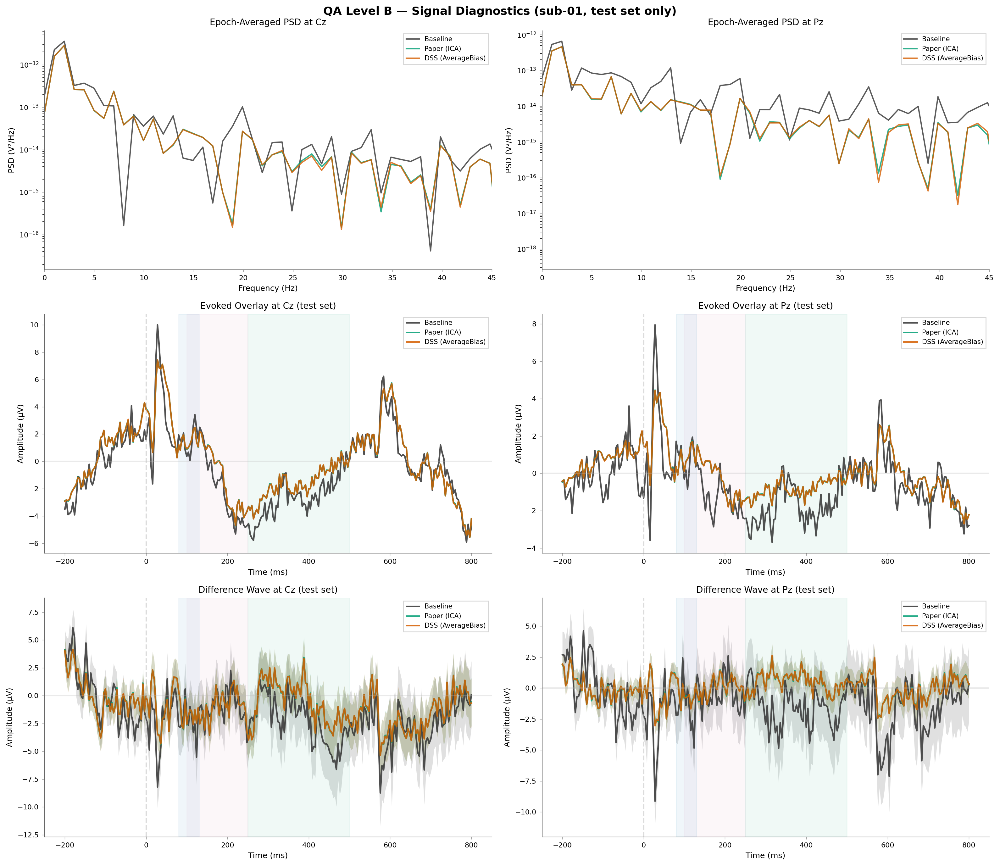

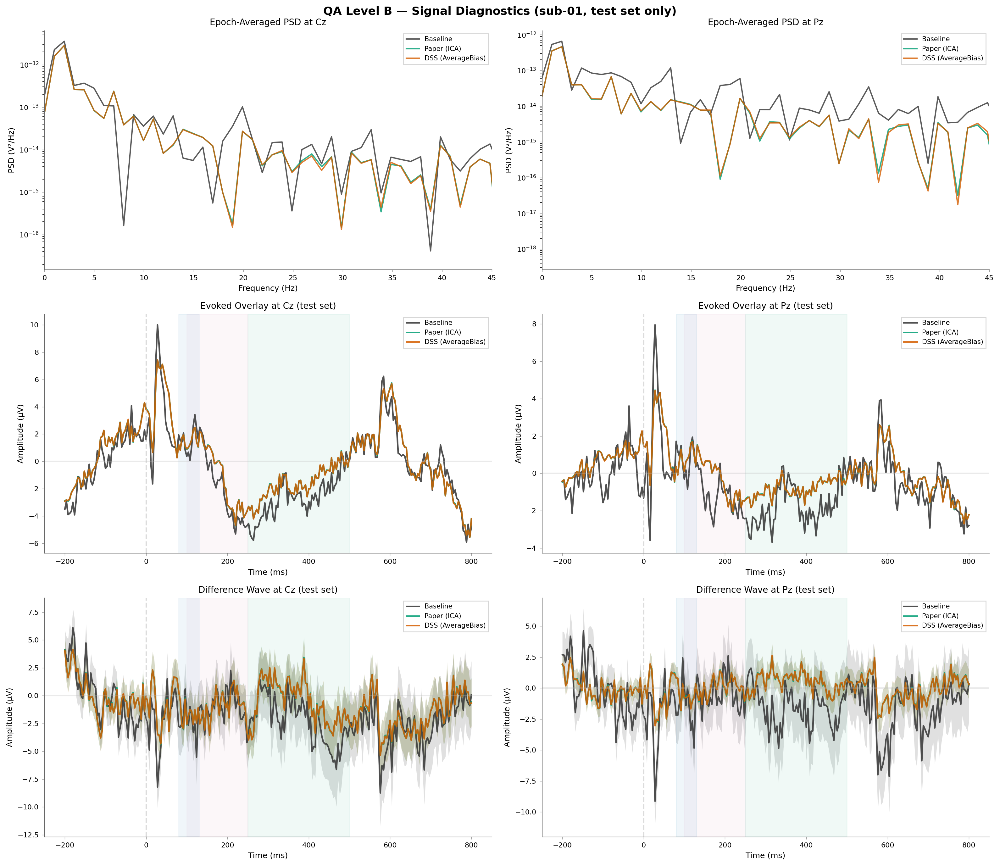

In [7]:
plot_signal_diagnostics_summary(
    {ptag: pipe_evokeds[ptag] for ptag in DEFAULT_PIPE_ORDER},
    channel=PRIMARY_CH,
    channel_names=epochs_train.ch_names,
    times=epochs_train.times,
    group_order=DEFAULT_PIPE_ORDER,
    reference_group="C0",
    group_colors=DEFAULT_PIPE_COLORS,
    group_labels=DEFAULT_PIPE_LABELS,
    windows=[(0.08, 0.13, "N1"), (0.25, 0.50, "P300")],
)

### 11.2 `plot_condition_interaction_summary`

Per-condition difference waves and Hedges' *g* interaction plot.
Returns two figures: (1) diff-wave overlays, (2) effect-size strip + interaction line.

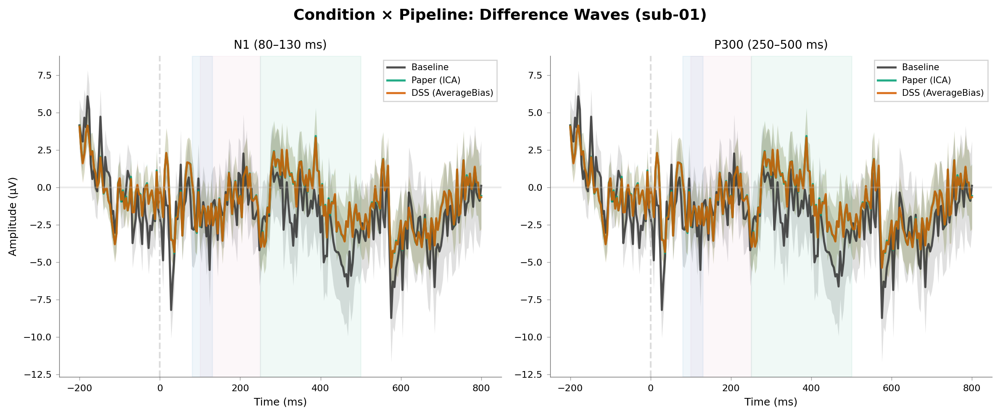

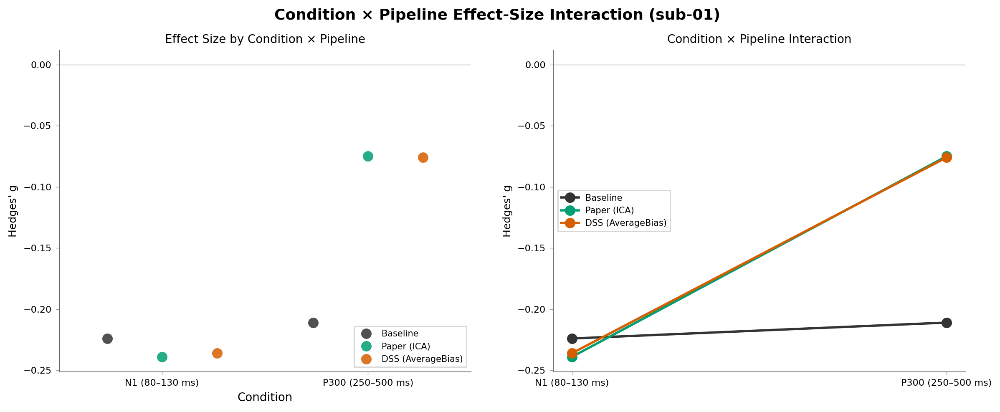

In [8]:
# ── Build per-condition diff waves & effect sizes for 2 conditions ──
conditions = ["N1", "P300"]
times_ms = epochs_train.times * 1000

diff_waves = {}
diff_se = {}
effect_sizes = {}

for cond in conditions:
    t0, t1 = {"N1": (0.08, 0.13), "P300": (0.25, 0.50)}[cond]
    for ptag in DEFAULT_PIPE_ORDER:
        ep = pipe_epochs[ptag]
        data = ep.get_data() if hasattr(ep, "get_data") else ep
        ci = ep.ch_names.index(PRIMARY_CH) if hasattr(ep, "ch_names") else 0

        dev = data[dev_mask, ci, :] * 1e6
        std = data[std_mask, ci, :] * 1e6
        dw = dev.mean(axis=0) - std.mean(axis=0)
        se = np.sqrt(dev.var(0) / dev.shape[0] + std.var(0) / std.shape[0])

        # Window-averaged Hedges' g
        t_mask = (epochs_train.times >= t0) & (epochs_train.times <= t1)
        dev_win = dev[:, t_mask].mean(axis=1)
        std_win = std[:, t_mask].mean(axis=1)
        pooled_sd = np.sqrt((dev_win.var() + std_win.var()) / 2)
        g = (dev_win.mean() - std_win.mean()) / max(pooled_sd, 1e-12)

        diff_waves[(cond, ptag)] = dw
        diff_se[(cond, ptag)] = se
        effect_sizes[(cond, ptag)] = round(g, 3)

traces_nested = {
    cond: {ptag: diff_waves[(cond, ptag)] for ptag in DEFAULT_PIPE_ORDER}
    for cond in conditions
}
errors_nested = {
    cond: {ptag: diff_se[(cond, ptag)] for ptag in DEFAULT_PIPE_ORDER}
    for cond in conditions
}

fig_int = plot_condition_interaction_summary(
    traces_nested,
    times=epochs_train.times,
    errors=errors_nested,
    condition_order=conditions,
    group_order=DEFAULT_PIPE_ORDER,
    group_colors=DEFAULT_PIPE_COLORS,
    group_labels=DEFAULT_PIPE_LABELS,
    title=f"{SUB}: condition interaction",
)

### 11.3 `plot_metric_violins`

Generic violin + swarm + within-subject paired lines for any set of metrics.
Works for both ERP and line-noise benchmarks.

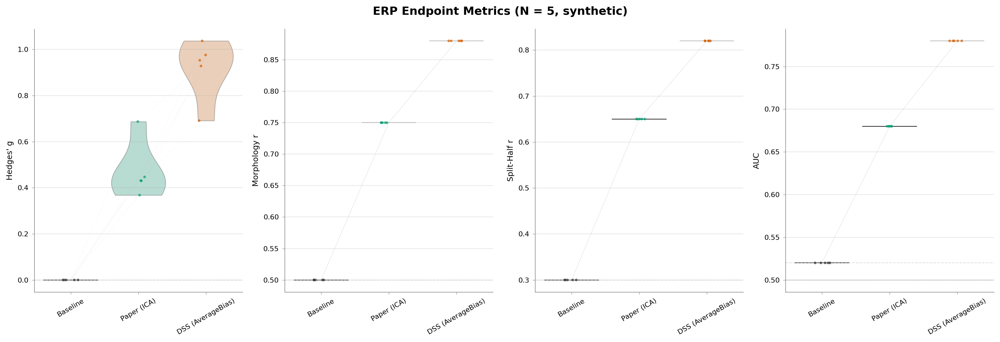

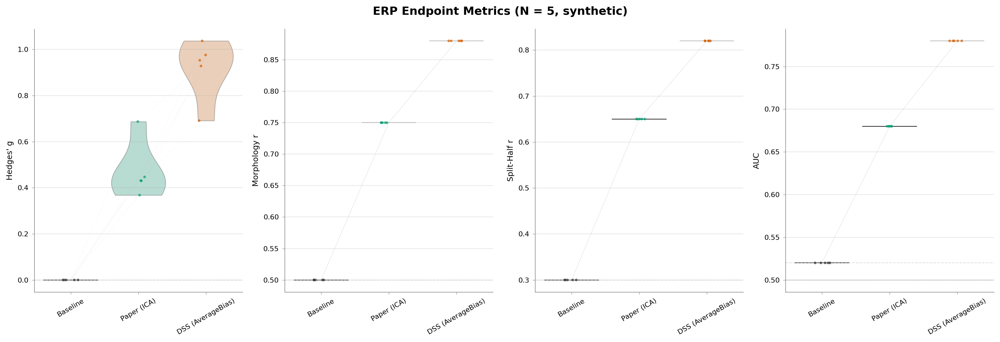

In [9]:
plot_metric_violins(
    erp_data,
    metric_cols=["hedges_g", "morph_r", "split_half_r", "auc"],
    metric_labels=["Hedges' g", "Morphology r", "Split-Half r", "AUC"],
    group_col="pipeline",
    subject_col="subject",
    group_order=DEFAULT_PIPE_ORDER,
    group_colors=DEFAULT_PIPE_COLORS,
    group_labels=DEFAULT_PIPE_LABELS,
    reference_lines={
        "auc": [(0.5, {"color": "k", "ls": ":", "lw": 0.7, "alpha": 0.5})]
    },
    suptitle="ERP Endpoint Metrics (N = 5, synthetic)",
)

### 11.4 `plot_endpoint_metrics_summary`

Multipanel storyboard: metric violins + null-distribution CI overlay +
paired-slope panel (Baseline → DSS).

D:\mne-denoise\condescending-liskov\mne_denoise\viz\_theme.py:276: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


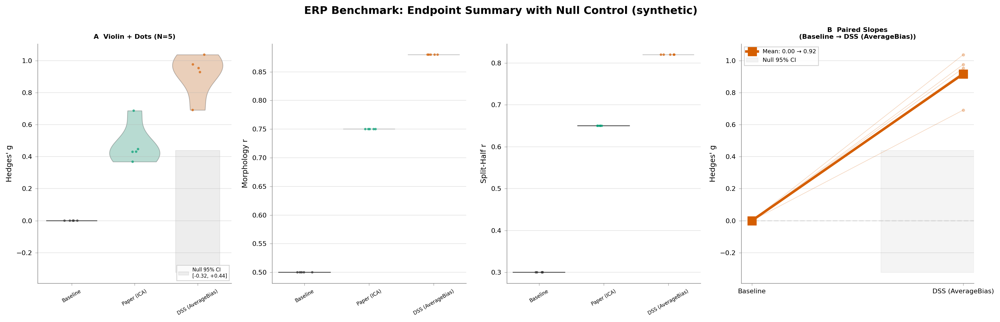

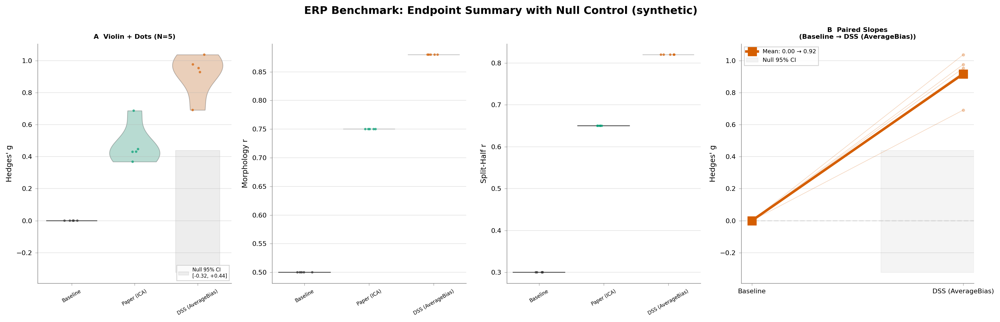

In [10]:
plot_endpoint_metrics_summary(
    erp_data,
    metric_col="hedges_g",
    group_col="pipeline",
    subject_col="subject",
    group_order=DEFAULT_PIPE_ORDER,
    group_colors=DEFAULT_PIPE_COLORS,
    group_labels=DEFAULT_PIPE_LABELS,
    null_distribution=null_g,
    observed_value=float(np.nanmean(erp_data["hedges_g"])),
    title="ERP Benchmark: Endpoint Summary with Null Control (synthetic)",
)

### 11.5 `plot_metric_slopes`

Multi-metric paired subject-level trajectories. Thin coloured lines
trace each subject across pipelines; a bold black line shows the group mean.

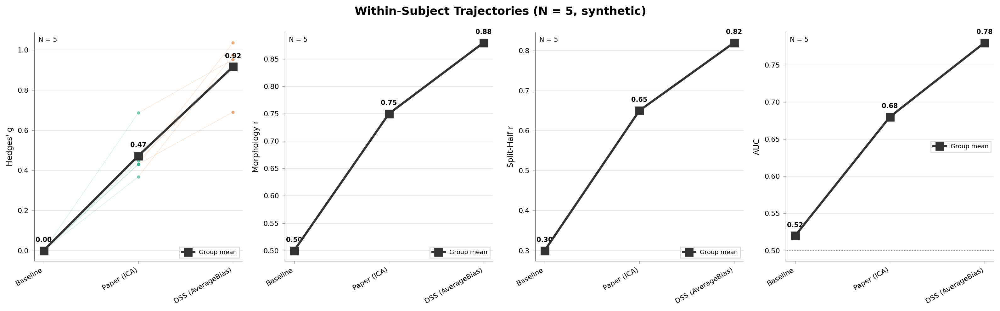

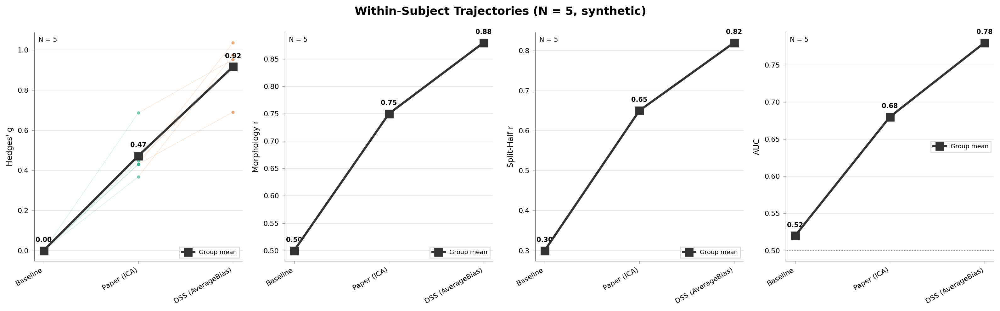

In [11]:
plot_metric_slopes(
    erp_data,
    metric_cols=["hedges_g", "morph_r", "split_half_r", "auc"],
    metric_labels=["Hedges' g", "Morphology r", "Split-Half r", "AUC"],
    group_col="pipeline",
    subject_col="subject",
    group_order=DEFAULT_PIPE_ORDER,
    group_colors=DEFAULT_PIPE_COLORS,
    group_labels=DEFAULT_PIPE_LABELS,
    reference_lines={
        "auc": [(0.5, {"color": "k", "ls": ":", "lw": 0.7, "alpha": 0.5})]
    },
    suptitle="Within-Subject Trajectories (N = 5, synthetic)",
)

---
## Section 12 — Multi-Subject / Group-Level ERP Plots

**Gap-fill functions** for the multi-subject / whole-run case. These complement
the single-subject Section 11 with between-subject error propagation:

| Function | Purpose |
|----------|---------|
| `plot_grand_average_evokeds` | Group-mean evoked ± between-subject SEM |
| `plot_group_condition_interaction_summary` | Group-level condition × pipeline with between-subject error bars |
| `plot_null_distribution` | Permutation null histogram + observed statistic |
| `plot_forest` | Per-subject effect-size forest plot with CI |


In [14]:
"""Cell 12.0 · Synthesize multi-subject ERP data for group-level plots.

We generate N_MULTI = 8 synthetic 'subjects' per pipeline by adding
random noise to the existing single-subject evokeds.  We also build
per-subject × per-condition diff-wave arrays and effect-size arrays
needed by plot_group_condition_interaction_summary.
"""
from mne_denoise.viz import (
    plot_forest,
    plot_grand_average_evokeds,
    plot_group_condition_interaction_summary,
    plot_null_distribution,
)

N_MULTI = 8
rng_multi = np.random.default_rng(42)

# ── 1. all_evokeds: {pipe_tag: [Evoked, ...]} ──
all_evokeds = {}
for ptag in DEFAULT_PIPE_ORDER:
    base = pipe_evokeds[ptag]
    evk_list = []
    for _ in range(N_MULTI):
        noisy = base.data + rng_multi.normal(0, 0.2e-6, base.data.shape)
        evk_list.append(
            mne.EvokedArray(noisy, base.info, tmin=base.tmin, verbose=False)
        )
    all_evokeds[ptag] = evk_list

# ── 2. all_diff_waves: {(cond, ptag): ndarray (N_MULTI, n_times)} ──
# ── 3. all_effect_sizes: {(cond, ptag): 1-D array (N_MULTI,)} ──
all_diff_waves = {}
all_effect_sizes_group = {}
times_ms_group = epochs_train.times * 1000

for cond in ["N1", "P300"]:
    t0, t1 = {"N1": (0.08, 0.13), "P300": (0.25, 0.50)}[cond]
    t_mask_g = (epochs_train.times >= t0) & (epochs_train.times <= t1)
    for ptag in DEFAULT_PIPE_ORDER:
        dw_stack = []
        g_stack = []
        base_ep = pipe_epochs[ptag]
        ci_ch = base_ep.ch_names.index(PRIMARY_CH)
        for _ in range(N_MULTI):
            data = base_ep.get_data()
            noise = rng_multi.normal(0, 0.15e-6, data.shape)
            data_noisy = data + noise
            dev_data = data_noisy[dev_mask, ci_ch, :] * 1e6
            std_data = data_noisy[std_mask, ci_ch, :] * 1e6
            dw = dev_data.mean(0) - std_data.mean(0)
            dw_stack.append(dw)
            dev_win = dev_data[:, t_mask_g].mean(1)
            std_win = std_data[:, t_mask_g].mean(1)
            psd = np.sqrt((dev_win.var() + std_win.var()) / 2)
            g_stack.append((dev_win.mean() - std_win.mean()) / max(psd, 1e-12))
        all_diff_waves[(cond, ptag)] = np.array(dw_stack)
        all_effect_sizes_group[(cond, ptag)] = np.array(g_stack)

print(f"all_evokeds: {len(all_evokeds)} pipes × {N_MULTI} subjects")
print(
    f"all_diff_waves: {len(all_diff_waves)} keys, shapes { {v.shape for v in all_diff_waves.values()} }"
)
print(f"all_effect_sizes_group: {len(all_effect_sizes_group)} keys")

all_evokeds: 3 pipes × 8 subjects
all_diff_waves: 6 keys, shapes {(8, 251)}
all_effect_sizes_group: 6 keys


### 12.1 `plot_grand_average_evokeds`

Group-mean evoked waveform ± between-subject SEM at selected channels.
One column per channel.  Shaded ribbon is SEM.


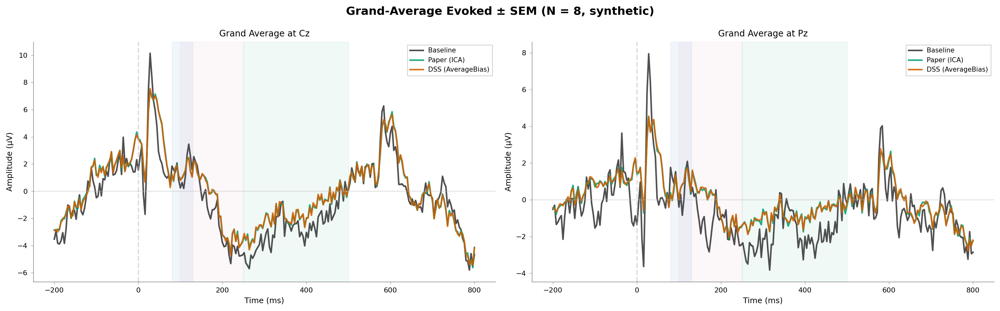

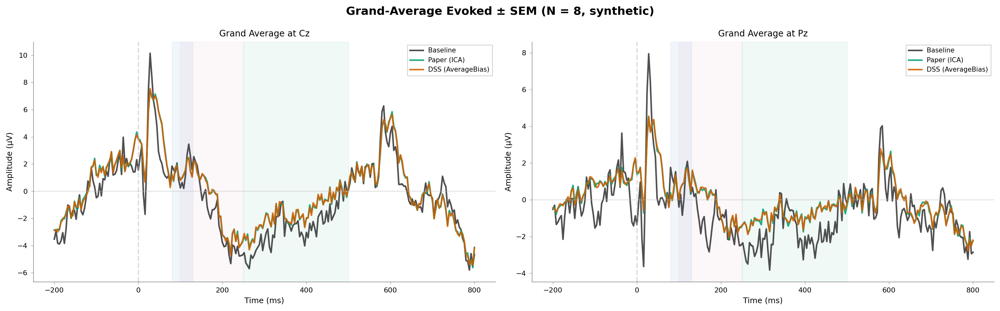

In [15]:
plot_grand_average_evokeds(
    all_evokeds,
    channels=(PRIMARY_CH, P300_CH),
    group_order=DEFAULT_PIPE_ORDER,
    group_colors=DEFAULT_PIPE_COLORS,
    group_labels=DEFAULT_PIPE_LABELS,
    suptitle=f"Grand-Average Evoked ± SEM (N = {N_MULTI}, synthetic)",
)

### 12.2 `plot_group_condition_interaction_summary`

Two figures: (1) Grand-average difference waves ± between-subject SEM per
condition, (2) Effect-size bar + interaction plot (group mean ± SEM).


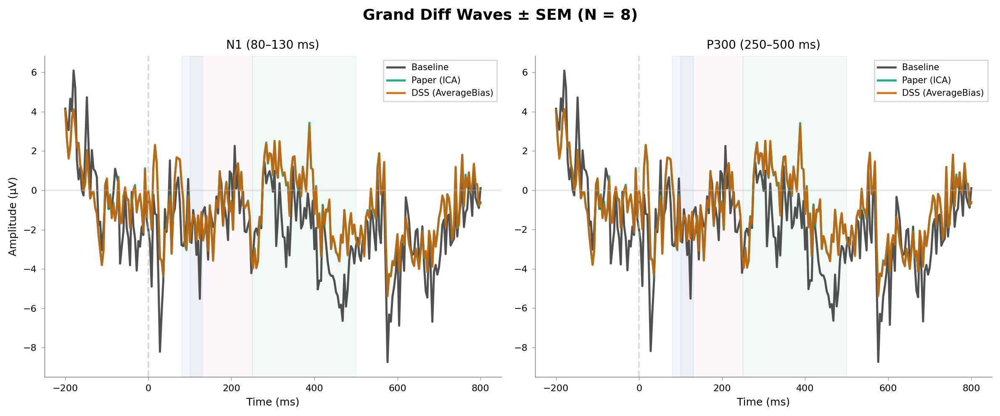

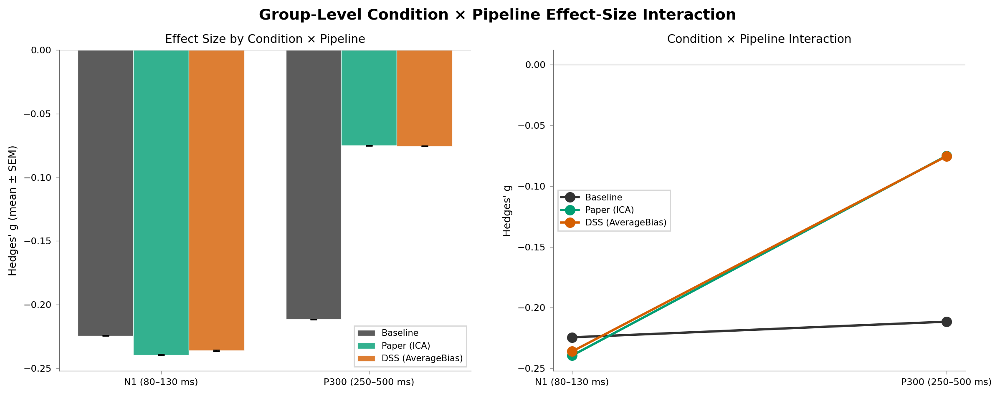

In [16]:
conditions_group = ["N1", "P300"]

group_traces = {
    ptag: {cond: all_diff_waves[(cond, ptag)].mean(axis=0) for cond in conditions_group}
    for ptag in DEFAULT_PIPE_ORDER
}
group_errors = {
    ptag: {
        cond: all_diff_waves[(cond, ptag)].std(axis=0, ddof=1) / np.sqrt(N_MULTI)
        for cond in conditions_group
    }
    for ptag in DEFAULT_PIPE_ORDER
}

fig_gi = plot_group_condition_interaction_summary(
    group_traces,
    times=epochs_train.times,
    errors=group_errors,
    condition_order=conditions_group,
    condition_labels={"N1": "N1 (80–130 ms)", "P300": "P300 (250–500 ms)"},
    group_order=DEFAULT_PIPE_ORDER,
    title=f"Grand Diff Waves ± SEM (N = {N_MULTI})",
)

### 12.3 `plot_null_distribution`

Histogram of the permutation null with observed statistic vertical line,
CI shading, and two-tailed *p*-value annotation.


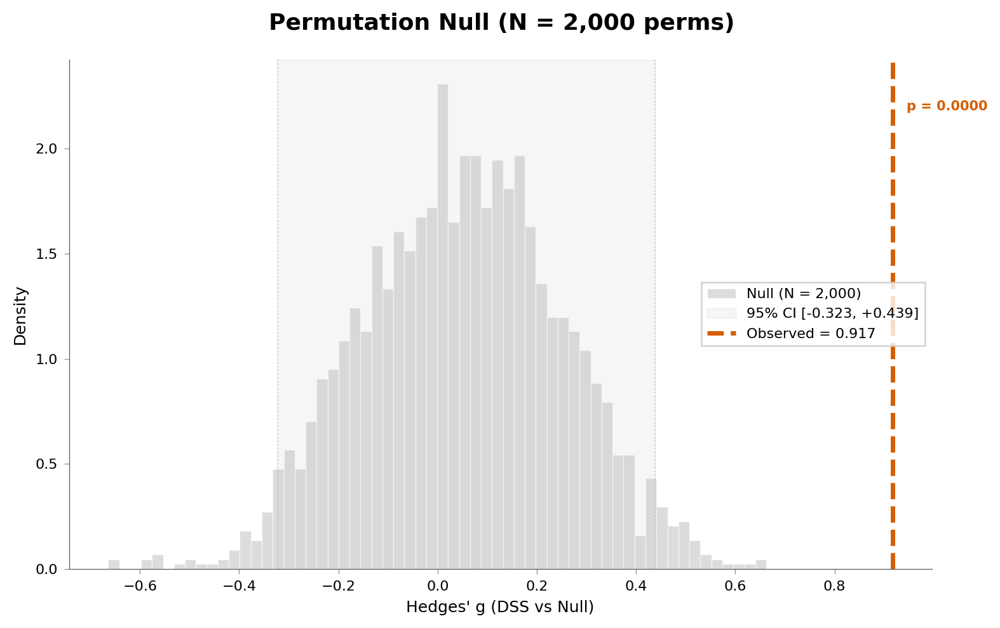

Observed g = 0.917, two-tailed p = 0.0000


In [17]:
# Use the null distribution from Section 11 (null_g, 2000 permutations)
# Pick an "observed" value from the DSS pipeline's effect sizes
observed_g = float(df_erp.loc[df_erp["pipeline"] == "C2", "hedges_g"].mean())
fig_null, p_val = plot_null_distribution(
    null_g,
    observed_g,
    metric_label="Hedges' g (DSS vs Null)",
    ci=95,
    suptitle=f"Permutation Null (N = {len(null_g):,} perms)",
)
print(f"Observed g = {observed_g:.3f}, two-tailed p = {p_val:.4f}")

### 12.4 `plot_forest`

Per-subject effect-size forest plot with 95 % CI.  Each row is one subject;
the diamond at the bottom is the pooled group mean.  Optionally shows a
baseline pipeline for comparison.


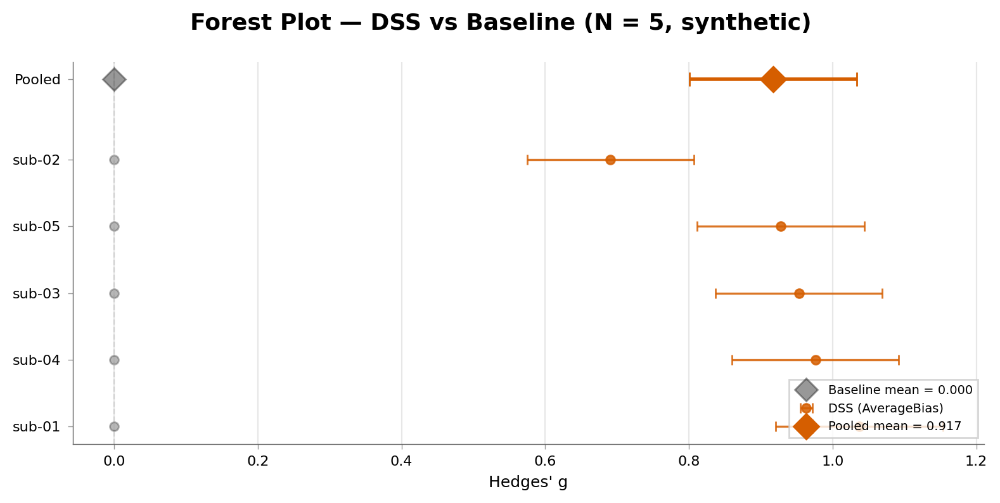

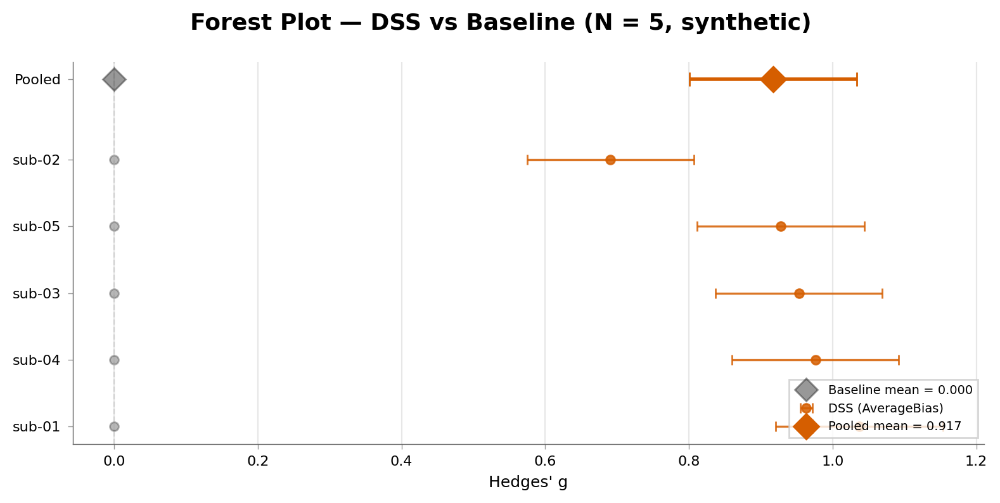

In [18]:
plot_forest(
    df_erp,
    metric_col="hedges_g",
    group_col="pipeline",
    subject_col="subject",
    target_group="C2",
    baseline_group="C0",
    group_colors=DEFAULT_PIPE_COLORS,
    group_labels=DEFAULT_PIPE_LABELS,
    metric_label="Hedges' g",
    suptitle="Forest Plot — DSS vs Baseline (N = 5, synthetic)",
)

---
## Summary

| Section | Functions tested |
|---------|----------------|
| Theme | `use_theme`, `themed_figure`, `get_color` |
| Comparison | `plot_psd_comparison`, `plot_evoked_gfp_comparison`, `plot_channel_time_course_comparison`, `plot_power_ratio_map`, `plot_spectrogram_comparison`, `plot_denoising_summary`, `plot_signal_overlay`, `plot_component_psd_comparison` |
| Components | `plot_component_score_curve`, `plot_component_patterns`, `plot_component_summary`, `plot_component_epochs_image`, `plot_component_time_series`, `plot_narrowband_score_scan`, `plot_time_frequency_mask`, `plot_component_spectrogram` |
| DSS | `plot_component_score_curve`, `plot_component_patterns`, `plot_component_cleaning_summary` |
| ZapLine | `plot_component_score_curve`, `plot_component_patterns`, `plot_component_cleaning_summary`, `plot_component_cleaning_summary` |
| Benchmark | `plot_metric_bars`, `plot_tradeoff_scatter`, `plot_metric_comparison`, `plot_metric_slopes`, `plot_metric_tradeoff_summary`, `plot_psd_zoom_comparison`, `plot_psd_gallery`, `plot_psd_overlay`, `plot_harmonic_attenuation` |
| **ERP Benchmark** | `plot_signal_diagnostics_summary`, `plot_condition_interaction_summary`, `plot_metric_violins`, `plot_endpoint_metrics_summary`, `plot_metric_slopes` |
| **ERP Group** | `plot_grand_average_evokeds`, `plot_group_condition_interaction_summary`, `plot_null_distribution`, `plot_forest` |

**Not tested (by design):**
- `set_theme` — mutates global rcParams (skip for notebook)
- Module-private helpers are covered indirectly via public plotting functions

Run each cell and tell me what to fix!